## Visualization of results & fitting of a Generalized Extreme Value Distribution on CC and SWM axon/myelin diameters
-------------------------------------------------------------------------------
Written by Philip Ruthig (University Leipzig, Paul-Flechsig-Institute), 2025.

This script uses the data generated from the image analysis pipelines for CC and SWM data (see CC and SWM folders), and aggregates and plots them for the paper: Ruthig, Edler v.d. Planitz et al: https://www.biorxiv.org/content/10.1101/2024.10.21.619354v1.

For the description of the axon and outer fiber diameters, a bayesian model is trained, describing the distributions with a generalized extreme value distribution each. Furthermore, some control plots are plotted and the conduction velocity is estimated, based on Rushton (1951) and Schmidt & Knösche (2019)

-------------------------------------------------------------------------------

In [1]:
import pymc as pm
import pymc_experimental as pmx
import arviz as az
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from scipy.stats import genextreme
from sklearn.linear_model import LinearRegression
import matplotlib.ticker as ticker
from scipy.stats import gaussian_kde
from matplotlib.ticker import FuncFormatter
%matplotlib inline
plt.rcParams['figure.dpi'] = 300 #300 for paper quality

def calculate_connection_velocity_rushton(axon_diameter, gratio):
    velocity = axon_diameter*((np.log(1/gratio))**0.68)*7.5 # factor 7.5 and exponent 0.68 according to Schmidt & Knösche, 2019
    return velocity

def z_score_dataframe(dataframe):
    """
    Z-scores a Pandas DataFrame.

    Parameters:
        dataframe (pd.DataFrame): The input DataFrame.

    Returns:
        pd.DataFrame: The z-scored DataFrame.
    """
    z_scored_dataframe = (dataframe - dataframe.mean()) / dataframe.std(ddof=0)
    return z_scored_dataframe

### Raw Data inspection & Plotting of different subgroups of data

In [2]:
# Get SWM data
data_swm_1 = pd.read_csv(r"SWM\3_postprocessed\SWM_parallel_anonymized.csv") # parallel data
data_swm_2 = pd.read_csv(r"SWM\3_postprocessed\SWM_orthogonal_anonymized.csv") # orthogonal data
data_swm = pd.concat([data_swm_1,data_swm_2])
# Get CC data
data_cc = pd.read_csv(r"CC\3_postprocessed\CC_anonymized.csv")

In [3]:
# print length of data_swm and data_cc
print("Length of data_swm:", len(data_swm))
print("Length of data_cc:", len(data_cc))

Length of data_swm: 220431
Length of data_cc: 163133


#### Eccentricity over the different regions

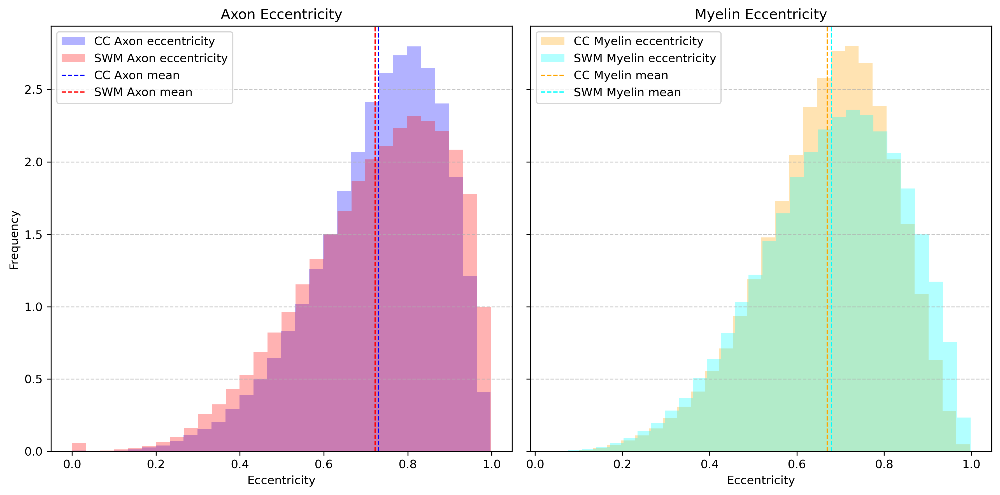

0.7300093076516654
0.7224101025867423
0.6693539955067024
0.6791480862313006


In [4]:
# Calculate medians
cc_inner_median = data_cc['inner_eccentricity'].mean()
cc_outer_median = data_cc['outer_eccentricity'].mean()
swm_inner_median = data_swm['inner_eccentricity'].mean()
swm_outer_median = data_swm['outer_eccentricity'].mean()

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True,dpi=300)

# Plot inner eccentricity (Axon histograms)
axs[0].hist(data_cc['inner_eccentricity'], bins=30, alpha=0.3, label='CC Axon eccentricity', color='blue', density=True)
axs[0].hist(data_swm['inner_eccentricity'], bins=30, alpha=0.3, label='SWM Axon eccentricity', color='red', density=True)
axs[0].axvline(cc_inner_median, color='blue', linestyle='dashed', linewidth=1, label='CC Axon mean')
axs[0].axvline(swm_inner_median, color='red', linestyle='dashed', linewidth=1, label='SWM Axon mean')
axs[0].set_xlabel('Eccentricity')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Axon Eccentricity')
axs[0].legend()
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

# Plot outer eccentricity (Myelin histograms)
axs[1].hist(data_cc['outer_eccentricity'], bins=30, alpha=0.3, label='CC Myelin eccentricity', color='orange', density=True)
axs[1].hist(data_swm['outer_eccentricity'], bins=30, alpha=0.3, label='SWM Myelin eccentricity', color='cyan', density=True)
axs[1].axvline(cc_outer_median, color='orange', linestyle='dashed', linewidth=1, label='CC Myelin mean')
axs[1].axvline(swm_outer_median, color='cyan', linestyle='dashed', linewidth=1, label='SWM Myelin mean')
axs[1].set_xlabel('Eccentricity')
axs[1].set_title('Myelin Eccentricity')
axs[1].legend()
axs[1].grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()
plt.show()

# print means of all four groups
print(cc_inner_median)
print(swm_inner_median)
print(cc_outer_median)
print(swm_outer_median)


#### Comparison with Mordhorst et al, 2022

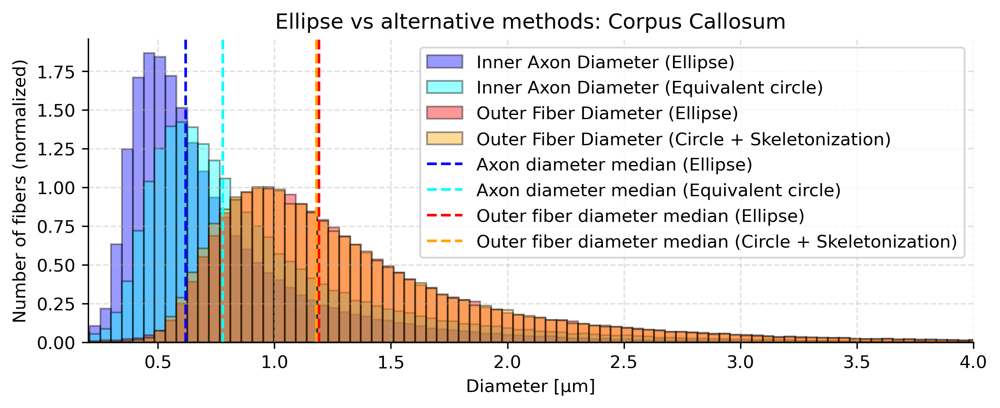

In [5]:
# # axon area in µm²
# data_cc['inner_area']
# # myelin area (including axon) in µm²
# data_cc['inner_area']+data_cc['outer_area']
# calculate equivalent circle radius according to segmented area
data_cc['inner_equivalent_circle_diameter'] = np.sqrt(data_cc['inner_area']/np.pi)*2
data_cc['outer_equivalent_circle_diameter'] =  np.sqrt((data_cc['inner_area']+data_cc['outer_area'])/np.pi)*2
# plot circle diameter vs diameter from the ellipse

fig, ax = plt.subplots(figsize=(8, 5 * 2 / 3),dpi=300)
bins = np.linspace(
    min(min(data_cc['inner_axis_minor_length']), min(data_cc['inner_equivalent_circle_diameter'])),
    max(max(data_cc['outer_axis_minor_length']), max(data_cc['outer_equivalent_circle_diameter'])),
    250
)

# Plot inner axon diameter (ellipse and equivalent circle)
ax.hist(data_cc['inner_axis_minor_length'], bins=bins, edgecolor='black', color='blue', alpha=0.4, label='Inner Axon Diameter (Ellipse)', density=True)
ax.hist(data_cc['inner_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='cyan', alpha=0.4, label='Inner Axon Diameter (Equivalent circle)', density=True)

# Plot outer fiber diameter (ellipse and equivalent circle)
ax.hist(data_cc['outer_axis_minor_length'], bins=bins, edgecolor='black', color='red', alpha=0.4, label='Outer Fiber Diameter (Ellipse)', density=True)
ax.hist(data_cc['outer_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='orange', alpha=0.4, label='Outer Fiber Diameter (Circle + Skeletonization)', density=True)

# Calculate and plot medians
medians = {
    "inner_ellipse": data_cc['inner_axis_minor_length'].median(),
    "inner_circle": data_cc['inner_equivalent_circle_diameter'].median(),
    "outer_ellipse": data_cc['outer_axis_minor_length'].median(),
    "outer_circle": data_cc['outer_equivalent_circle_diameter'].median()
}

# Add vertical lines for medians
ax.axvline(medians["inner_ellipse"], color='blue', linestyle='--', label='Axon diameter median (Ellipse)')
ax.axvline(medians["inner_circle"], color='cyan', linestyle='--', label='Axon diameter median (Equivalent circle)')
ax.axvline(medians["outer_ellipse"], color='red', linestyle='--', label='Outer fiber diameter median (Ellipse)')
ax.axvline(medians["outer_circle"], color='orange', linestyle='--', label='Outer fiber diameter median (Circle + Skeletonization)')

# Customize plot elements
ax.set_ylabel('Number of fibers (normalized)', fontsize=10)
ax.set_xlabel('Diameter [µm]', fontsize=10)
ax.set_xlim(0.2, 4)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

# Remove unnecessary spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Adjust layout and show the plot
plt.title('Ellipse vs alternative methods: Corpus Callosum')
plt.tight_layout()
plt.show()


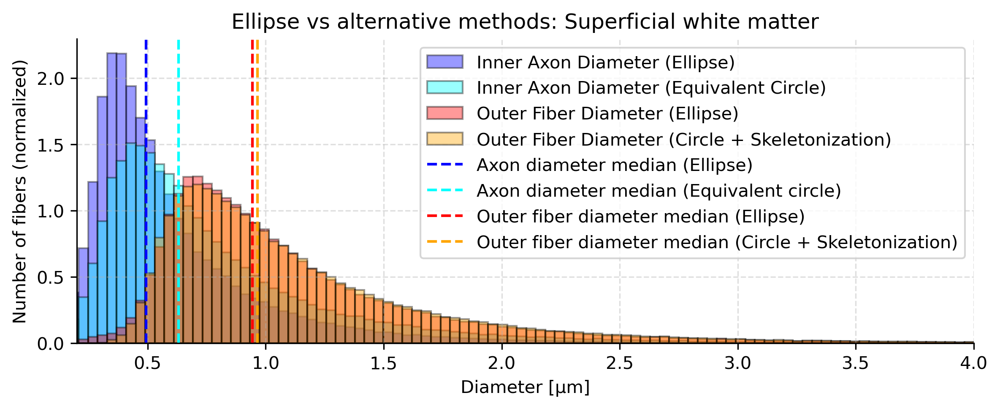

In [6]:
# # axon area in µm²
# data_swm['inner_area']
# # myelin area (including axon) in µm²
# data_swm['inner_area']+data_swm['outer_area']
# calculate equivalent circle radius according to segmented area
data_swm['inner_equivalent_circle_diameter'] = np.sqrt(data_swm['inner_area']/np.pi)*2
data_swm['outer_equivalent_circle_diameter']=  np.sqrt((data_swm['inner_area']+data_swm['outer_area'])/np.pi)*2

# plot circle diameter vs diameter from the ellipse
fig, ax = plt.subplots(figsize=(8, 5 * 2 / 3),dpi=300)

bins = np.linspace(
    min(min(data_swm['inner_axis_minor_length']), min(data_swm['inner_equivalent_circle_diameter'])),
    max(max(data_swm['outer_axis_minor_length']), max(data_swm['outer_equivalent_circle_diameter'])),
    250
)

# Plot inner axon diameter (ellipse and equivalent circle)
ax.hist(data_swm['inner_axis_minor_length'], bins=bins, edgecolor='black', color='blue', alpha=0.4, label='Inner Axon Diameter (Ellipse)', density=True)
ax.hist(data_swm['inner_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='cyan', alpha=0.4, label='Inner Axon Diameter (Equivalent Circle)', density=True)

# Plot outer fiber diameter (ellipse and equivalent circle)
ax.hist(data_swm['outer_axis_minor_length'], bins=bins, edgecolor='black', color='red', alpha=0.4, label='Outer Fiber Diameter (Ellipse)', density=True)
ax.hist(data_swm['outer_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='orange', alpha=0.4, label='Outer Fiber Diameter (Circle + Skeletonization)', density=True)

# Calculate and plot medians
medians = {
    "inner_ellipse": data_swm['inner_axis_minor_length'].median(),
    "inner_circle": data_swm['inner_equivalent_circle_diameter'].median(),
    "outer_ellipse": data_swm['outer_axis_minor_length'].median(),
    "outer_circle": data_swm['outer_equivalent_circle_diameter'].median()
}

ax.axvline(medians["inner_ellipse"], color='blue', linestyle='--', label='Axon diameter median (Ellipse)')
ax.axvline(medians["inner_circle"], color='cyan', linestyle='--', label='Axon diameter median (Equivalent circle)')
ax.axvline(medians["outer_ellipse"], color='red', linestyle='--', label='Outer fiber diameter median (Ellipse)')
ax.axvline(medians["outer_circle"], color='orange', linestyle='--', label='Outer fiber diameter median (Circle + Skeletonization)')

# Customize plot elements
ax.set_ylabel('Number of fibers (normalized)', fontsize=10)
ax.set_xlabel('Diameter [µm]', fontsize=10)
ax.set_xlim(0.2, 4)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

# Remove unnecessary spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Adjust layout and show the plot
plt.title('Ellipse vs alternative methods: Superficial white matter')
plt.tight_layout()
plt.show()


In [7]:
# # calculate g-ratios based on equivalent circle
# data_cc['gratio_equivalent_circle'] = data_cc['inner_equivalent_circle_diameter']/data_cc['outer_equivalent_circle_diameter']
# data_swm['gratio_equivalent_circle'] = data_swm['inner_equivalent_circle_diameter']/data_swm['outer_equivalent_circle_diameter']

# # plot g-ratio distributions based on equivalent circle diameters
# fig, ax = plt.subplots(dpi=100)

# # Plot for swm
# ax.hist(data_swm['gratio_equivalent_circle'], bins=40, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# ax.axvline(data_swm['gratio_equivalent_circle'].median(), color='darkorange', linestyle='--',alpha = 0.6, label='Median (SWM)')

# # Plot for cc
# ax.hist(data_cc['gratio_equivalent_circle'], bins=40, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# ax.axvline(data_cc['gratio_equivalent_circle'].median(), color='darkblue', linestyle='--',alpha = 0.6, label='Median (CC)')

# # Customize plot elements
# ax.set_ylabel('Number of cells (normalized)')
# ax.set_xlabel('G Ratio')
# ax.set_xlim(0, 1)  # Lock x-axis between 0 and 1
# ax.grid(True, linestyle='--', alpha=0.4, which='both')
# ax.legend()

# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)

# # Adjust layout and show the plot
# plt.tight_layout()
# plt.show()

# print(f"Mean for gratio in CC: {round(data_cc['gratio_equivalent_circle'].mean(), 3)} \nMean for gratio in SWM: {round(data_swm['gratio_equivalent_circle'].mean(), 3)}")


In [8]:
## calculate gratio according to MRI-contrast:
# sum all myelin areas and all axon areas
MVF_CC = data_cc['outer_area'].sum()
AVF_CC = data_cc['inner_area'].sum()
gratio_mri_cc = np.sqrt(1-(MVF_CC/(MVF_CC+AVF_CC)))
print(f"Gratio in CC according to MRI volume fraction equivalent: {gratio_mri_cc}")
## calculate gratio according to MRI-contrast:
# sum all myelin areas and all axon areas
MVF_SWM = data_swm['outer_area'].sum()
AVF_SWM = data_swm['inner_area'].sum()
gratio_mri_swm = np.sqrt(1-(MVF_SWM/(MVF_SWM+AVF_SWM)))
print(f"Gratio in SWM according to MRI volume fraction equivalent: {gratio_mri_swm}")

Gratio in CC according to MRI volume fraction equivalent: 0.7232662194637438
Gratio in SWM according to MRI volume fraction equivalent: 0.7076105722956756


#### Comparison with Raschke et al, 2008

In [9]:
# Here, we calculate the fraction below .65 for the comparison to the data by Raschke et al, 2008
cc_count_below_65 = (data_swm['inner_axis_minor_length'] < 0.65).sum()
swm_count_below_65 = (data_swm['inner_axis_minor_length'] < 0.65).sum()
cc_fraction_below_65 = cc_count_below_65/len(data_swm['inner_axis_minor_length'])
swm_fraction_below_65 = swm_count_below_65/len(data_swm['inner_axis_minor_length'])
print(f"Fraction of axons below .65µm in CC: {cc_fraction_below_65}")
print(f"Fraction of axons below .65µm in SWM: {swm_fraction_below_65}")

Fraction of axons below .65µm in CC: 0.6921712463310514
Fraction of axons below .65µm in SWM: 0.6921712463310514


#### Comparison of parallel vs. orthogonal cuts in SWM

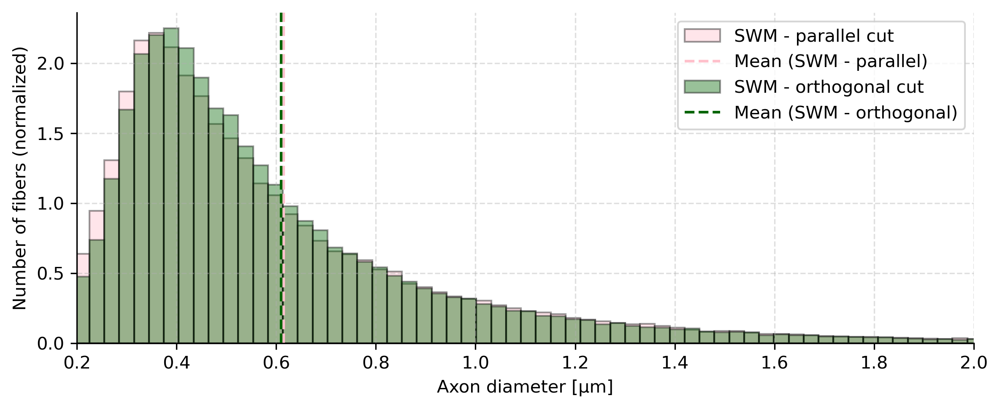

Mean axon Diameter (SWM - parallel): 0.615062621800926
Mean axon Diameter (SWM - orthogonal): 0.610066074220707
Ratio parallel/orthogonal: 1.0081901744603672


In [10]:
# visualize raw data of orthogonally vs parallel cut axons
fig, ax = plt.subplots(figsize=(8, 5*2/3),dpi=300)

bins = np.linspace(min(min(data_swm['inner_axis_minor_length']), min(data_cc['inner_axis_minor_length'])),
                   max(max(data_swm['inner_axis_minor_length']), max(data_cc['inner_axis_minor_length'])), 250)

# Plot parallel cut data
ax.hist(data_swm_1['inner_axis_minor_length'], bins=bins, edgecolor='black', color='pink', alpha=0.4, label='SWM - parallel cut', density=True)
ax.axvline(data_swm_1['inner_axis_minor_length'].mean(), color='pink', linestyle='--', label='Mean (SWM - parallel)')

# Plot orthogonally cut data
ax.hist(data_swm_2['inner_axis_minor_length'], bins=bins, edgecolor='black', color='darkgreen', alpha=0.4, label='SWM - orthogonal cut', density=True)
ax.axvline(data_swm_2['inner_axis_minor_length'].mean(), color='darkgreen', linestyle='--', label='Mean (SWM - orthogonal)')

# Customize plot elements
ax.set_ylabel('Number of fibers (normalized)')
ax.set_xlabel('Axon diameter [µm]')
ax.set_xlim(0.2,2)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Mean axon Diameter (SWM - parallel): {data_swm_1['inner_axis_minor_length'].mean()}")
print(f"Mean axon Diameter (SWM - orthogonal): {data_swm_2['inner_axis_minor_length'].mean()}")
print(f"Ratio parallel/orthogonal: {data_swm_1['inner_axis_minor_length'].mean()/data_swm_2['inner_axis_minor_length'].mean()}")


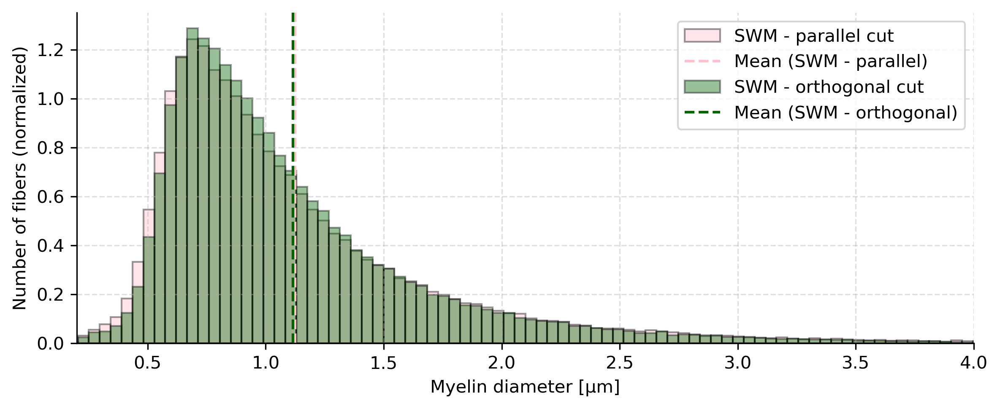

Mean myelin Diameter (SWM - parallel): 1.1236824825577836
Mean myelin Diameter (SWM - orthogonal): 1.1158380171777418
Ratio parallel/orthogonal: 1.00703011123414


In [11]:
# visualize raw data of orthogonally vs parallel cut axons
fig, ax = plt.subplots(figsize=(8, 5*2/3),dpi=300)

bins = np.linspace(min(min(data_swm['outer_axis_minor_length']), min(data_cc['outer_axis_minor_length'])),
                   max(max(data_swm['outer_axis_minor_length']), max(data_cc['outer_axis_minor_length'])), 250)

# Plot parallel cut data
ax.hist(data_swm_1['outer_axis_minor_length'], bins=bins, edgecolor='black', color='pink', alpha=0.4, label='SWM - parallel cut', density=True)
ax.axvline(data_swm_1['outer_axis_minor_length'].mean(), color='pink', linestyle='--', label='Mean (SWM - parallel)')

# Plot orthogonally cut data
ax.hist(data_swm_2['outer_axis_minor_length'], bins=bins, edgecolor='black', color='darkgreen', alpha=0.4, label='SWM - orthogonal cut', density=True)
ax.axvline(data_swm_2['outer_axis_minor_length'].mean(), color='darkgreen', linestyle='--', label='Mean (SWM - orthogonal)')

# Customize plot elements
ax.set_ylabel('Number of fibers (normalized)')
ax.set_xlabel('Myelin diameter [µm]')
ax.set_xlim(0.2,4)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Mean myelin Diameter (SWM - parallel): {data_swm_1['outer_axis_minor_length'].mean()}")
print(f"Mean myelin Diameter (SWM - orthogonal): {data_swm_2['outer_axis_minor_length'].mean()}")
print(f"Ratio parallel/orthogonal: {data_swm_1['outer_axis_minor_length'].mean()/data_swm_2['outer_axis_minor_length'].mean()}")


#### Comparison of equivalent circle and ellipse fitting in parallel and orthogonal cuts

In [12]:
# # axon area in µm²
# data_swm_1['inner_area']
# # myelin area (including axon) in µm²
# data_swm_1['inner_area']+data_swm_1['outer_area']
# calculate equivalent circle radius according to segmented area
data_swm_1['inner_equivalent_circle_diameter'] = np.sqrt(data_swm_1['inner_area']/np.pi)*2
data_swm_1['outer_equivalent_circle_diameter']=  np.sqrt((data_swm_1['inner_area']+data_swm_1['outer_area'])/np.pi)*2

# # axon area in µm²
# data_swm_2['inner_area']
# # myelin area (including axon) in µm²
# data_swm_2['inner_area']+data_swm_2['outer_area']
# calculate equivalent circle radius according to segmented area
data_swm_2['inner_equivalent_circle_diameter'] = np.sqrt(data_swm_2['inner_area']/np.pi)*2
data_swm_2['outer_equivalent_circle_diameter']=  np.sqrt((data_swm_2['inner_area']+data_swm_2['outer_area'])/np.pi)*2

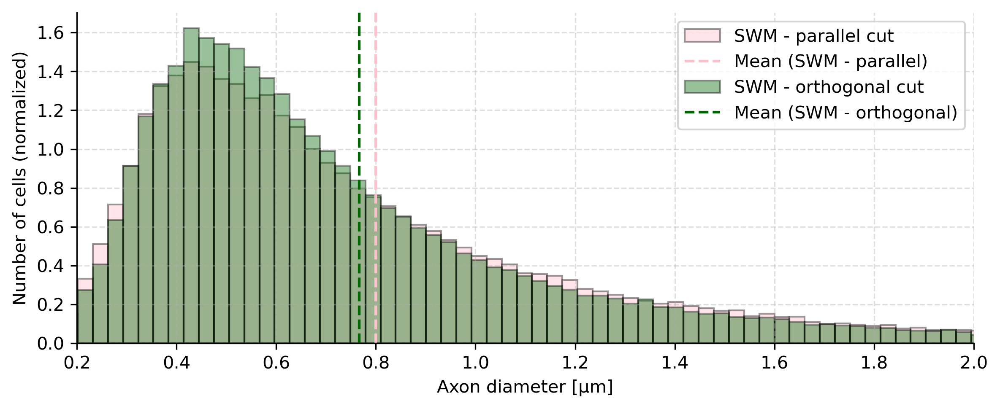

Mean axon Diameter (SWM - parallel): 0.7999866660833048
Mean axon Diameter (SWM - orthogonal): 0.7665200539971914
Ratio parallel/orthogonal: 1.0436604520802741


In [13]:
# visualize raw data of orthogonally vs parallel cut axons
fig, ax = plt.subplots(figsize=(8, 5*2/3))

bins = np.linspace(min(min(data_swm_1['inner_equivalent_circle_diameter']), min(data_swm_2['inner_equivalent_circle_diameter'])),
                   max(max(data_swm_1['inner_equivalent_circle_diameter']), max(data_swm_2['inner_equivalent_circle_diameter'])), 250)

# Plot parallel cut data
ax.hist(data_swm_1['inner_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='pink', alpha=0.4, label='SWM - parallel cut', density=True)
ax.axvline(data_swm_1['inner_equivalent_circle_diameter'].mean(), color='pink', linestyle='--', label='Mean (SWM - parallel)')

# Plot orthogonally cut data
ax.hist(data_swm_2['inner_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='darkgreen', alpha=0.4, label='SWM - orthogonal cut', density=True)
ax.axvline(data_swm_2['inner_equivalent_circle_diameter'].mean(), color='darkgreen', linestyle='--', label='Mean (SWM - orthogonal)')

# Customize plot elements
ax.set_ylabel('Number of cells (normalized)')
ax.set_xlabel('Axon diameter [µm]')
ax.set_xlim(0.2,2)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Mean axon Diameter (SWM - parallel): {data_swm_1['inner_equivalent_circle_diameter'].mean()}")
print(f"Mean axon Diameter (SWM - orthogonal): {data_swm_2['inner_equivalent_circle_diameter'].mean()}")
print(f"Ratio parallel/orthogonal: {data_swm_1['inner_equivalent_circle_diameter'].mean()/data_swm_2['inner_equivalent_circle_diameter'].mean()}")

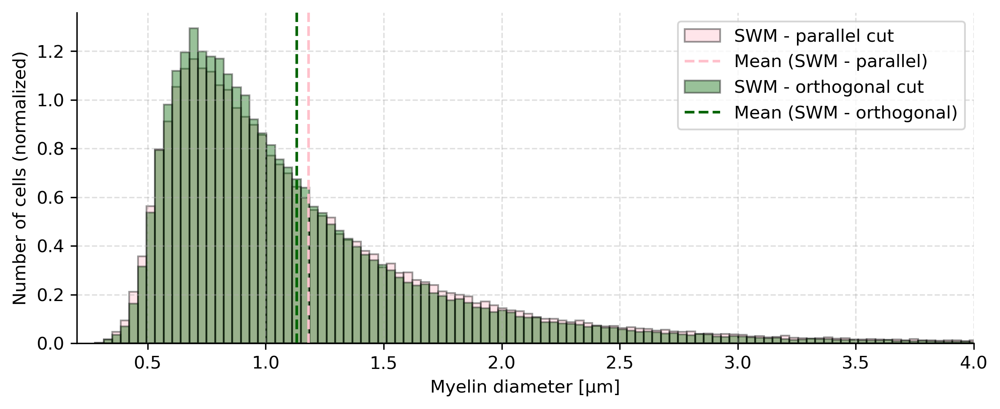

Mean myelin Diameter (SWM - parallel): 1.1236824825577836
Mean myelin Diameter (SWM - orthogonal): 1.1315868426802334
Ratio parallel/orthogonal: 1.0445162947088698


In [14]:
# visualize raw data of orthogonally vs parallel cut axons
fig, ax = plt.subplots(figsize=(8, 5*2/3))

bins = np.linspace(min(min(data_swm_1['outer_equivalent_circle_diameter']), min(data_swm_2['outer_equivalent_circle_diameter'])),
                   max(max(data_swm_1['outer_equivalent_circle_diameter']), max(data_swm_2['outer_equivalent_circle_diameter'])), 250)

# Plot parallel cut data
ax.hist(data_swm_1['outer_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='pink', alpha=0.4, label='SWM - parallel cut', density=True)
ax.axvline(data_swm_1['outer_equivalent_circle_diameter'].mean(), color='pink', linestyle='--', label='Mean (SWM - parallel)')

# Plot orthogonally cut data
ax.hist(data_swm_2['outer_equivalent_circle_diameter'], bins=bins, edgecolor='black', color='darkgreen', alpha=0.4, label='SWM - orthogonal cut', density=True)
ax.axvline(data_swm_2['outer_equivalent_circle_diameter'].mean(), color='darkgreen', linestyle='--', label='Mean (SWM - orthogonal)')

# Customize plot elements
ax.set_ylabel('Number of cells (normalized)')
ax.set_xlabel('Myelin diameter [µm]')
ax.set_xlim(0.2,4)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Mean myelin Diameter (SWM - parallel): {data_swm_1['outer_axis_minor_length'].mean()}")
print(f"Mean myelin Diameter (SWM - orthogonal): {data_swm_2['outer_equivalent_circle_diameter'].mean()}")
print(f"Ratio parallel/orthogonal: {data_swm_1['outer_equivalent_circle_diameter'].mean()/data_swm_2['outer_equivalent_circle_diameter'].mean()}")


#### Comparison of different individuals

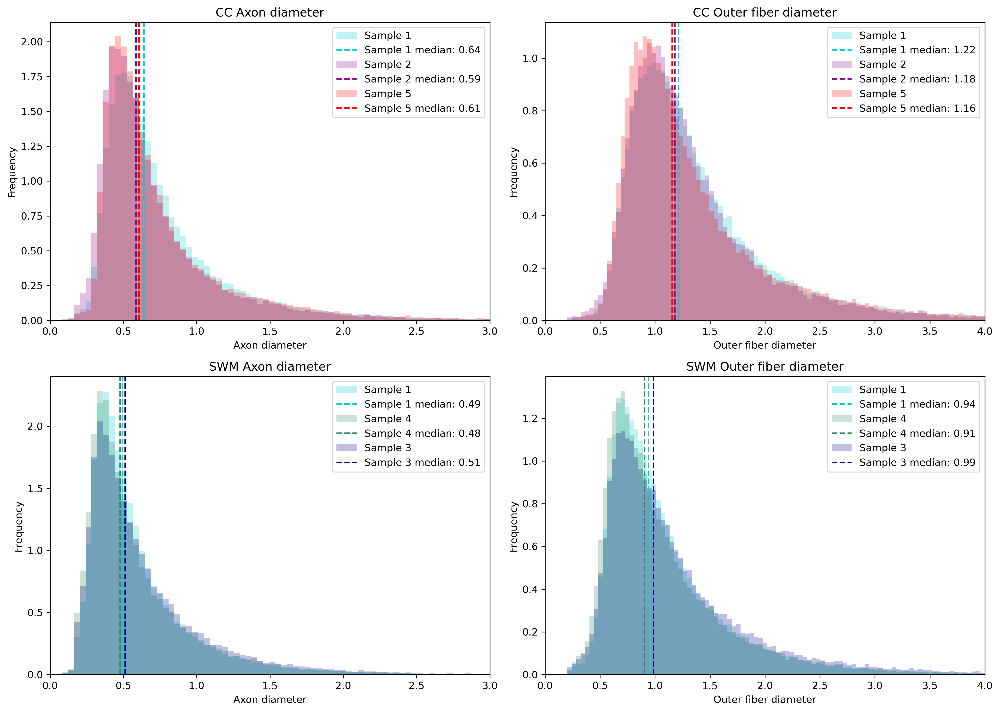

In [15]:
bins_individuals = np.linspace(0, 4, 100)  # Adjust the number of bins as needed
# Split dataframes according to individuals
data_cc_sample1 = data_cc[data_cc['file'].str.contains('Sample1')]
data_cc_sample2 = data_cc[data_cc['file'].str.contains('Sample2')]
data_cc_sample5 = data_cc[data_cc['file'].str.contains('Sample5')]
data_swm_sample1 = data_swm[data_swm['file'].str.contains('Sample1')]
data_swm_sample4 = data_swm[data_swm['file'].str.contains('Sample4')]
data_swm_sample3 = data_swm[data_swm['file'].str.contains('Sample3')]

# List of DataFrames and corresponding labels
cc_dataframes = [data_cc_sample1, data_cc_sample2, data_cc_sample5]
cc_labels = ["Sample 1", "Sample 2", "Sample 5"]
swm_dataframes = [data_swm_sample1, data_swm_sample4, data_swm_sample3]
swm_labels = ["Sample 1", "Sample 4", "Sample 3"]

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10),dpi=300)

# colors_cc = ['navy', 'blueviolet', 'mediumorchid']
# colors_swm = ['navy', 'darkcyan', 'darkgreen']
colors_cc = ['darkturquoise', 'darkmagenta', 'red']   # CC: Sample1, Sample2, Sample5
colors_swm = ['darkturquoise', 'seagreen', 'darkblue']     # SWM: Sample1, Sample4, Sample3

alpha = 0.25

for df, label, color in zip(cc_dataframes, cc_labels, colors_cc):
    axes[0, 0].hist(df['inner_axis_minor_length'], bins=bins_individuals, alpha=alpha, label=label, density=True, color=color)
    median = df['inner_axis_minor_length'].median()
    axes[0, 0].axvline(median, color=color, linestyle='--', label=f'{label} median: {median:.2f}')

axes[0, 0].set_title('CC Axon diameter')
axes[0, 0].set_xlabel('Axon diameter')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_xlim(0, 3)
axes[0, 0].legend()

for df, label, color in zip(swm_dataframes, swm_labels, colors_swm):
    axes[1, 0].hist(df['inner_axis_minor_length'], bins=bins_individuals, alpha=alpha, label=label, density=True, color=color)
    median = df['inner_axis_minor_length'].median()
    axes[1, 0].axvline(median, color=color, linestyle='--', label=f'{label} median: {median:.2f}')

axes[1, 0].set_title('SWM Axon diameter')
axes[1, 0].set_xlabel('Axon diameter')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].set_xlim(0, 3)
axes[1, 0].legend()

# Plot histograms for outer diameter (SWM: bottom-right, CC: top-right)
for df, label, color in zip(swm_dataframes, swm_labels, colors_swm):
    axes[1, 1].hist(df['outer_axis_minor_length'], bins=bins_individuals, alpha=alpha, label=label, density=True, color=color)
    median = df['outer_axis_minor_length'].median()
    axes[1, 1].axvline(median, color=color, linestyle='--', label=f'{label} median: {median:.2f}')

axes[1, 1].set_title('SWM Outer fiber diameter')
axes[1, 1].set_xlabel('Outer fiber diameter')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].set_xlim(0, 4)
axes[1, 1].legend()

for df, label, color in zip(cc_dataframes, cc_labels, colors_cc):
    axes[0, 1].hist(df['outer_axis_minor_length'], bins=bins_individuals, alpha=alpha, label=label, density=True, color=color)
    median = df['outer_axis_minor_length'].median()
    axes[0, 1].axvline(median, color=color, linestyle='--', label=f'{label} median: {median:.2f}')

axes[0, 1].set_title('CC Outer fiber diameter')
axes[0, 1].set_xlabel('Outer fiber diameter')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_xlim(0, 4)
axes[0, 1].legend()

plt.tight_layout()
plt.show()

#### Comparison of g-ratio in SWM and CC

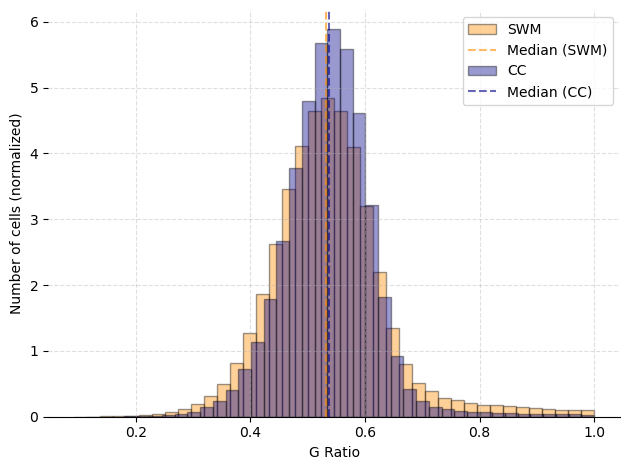

Mean for gratio in CC: 0.537 
Mean for gratio in SWM: 0.538


In [16]:
# plot g-ratio distributions
fig, ax = plt.subplots(dpi=100)

# Plot for swm
ax.hist(data_swm['gratio'], bins=40, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
ax.axvline(data_swm['gratio'].median(), color='darkorange', linestyle='--',alpha = 0.6, label='Median (SWM)')

# Plot for cc
ax.hist(data_cc['gratio'], bins=40, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
ax.axvline(data_cc['gratio'].median(), color='darkblue', linestyle='--',alpha = 0.6, label='Median (CC)')

# Customize plot elements
ax.set_ylabel('Number of cells (normalized)')
ax.set_xlabel('G Ratio')
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print(f"Mean for gratio in CC: {round(data_cc['gratio'].mean(), 3)} \nMean for gratio in SWM: {round(data_swm['gratio'].mean(), 3)}")


In [17]:
# compare g-ratio proportions of g-ratio>0.7
cc_count_above_07 = (data_cc['gratio'] > 0.75).sum()/len(data_cc['gratio'])
swm_count_above_07 = (data_swm['gratio'] > 0.75).sum()/len(data_swm['gratio'])

print(f"Fraction of axons with g-ratio > 0.75 in CC: {cc_count_above_07}")
print(f"Fraction of axons with g-ratio > 0.75 in SWM: {swm_count_above_07}")

Fraction of axons with g-ratio > 0.75 in CC: 0.013326549502553131
Fraction of axons with g-ratio > 0.75 in SWM: 0.03843833217650875


### Bayesian Modelling using Generalized Extreme Value Function

#### Model definition

In [18]:
with pm.Model() as model:
    # Priors are taken from Nik's GEV fit to Corpus Callosum data.
    swm_mu_inner = pm.TruncatedNormal('swm_mu_inner', mu=0.55, sigma=0.1, lower=0.05,)
    swm_sigma_inner = pm.TruncatedNormal('swm_sigma_inner', mu=0.35, sigma=0.1, lower=0.001,)
    swm_xi_inner = pm.TruncatedNormal('swm_xi_inner', mu=0.25, sigma=0.15, lower=0, upper=0.5,)

    cc_mu_inner = pm.TruncatedNormal('cc_mu_inner', mu=0.55, sigma=0.1, lower=0.05,)
    cc_sigma_inner = pm.TruncatedNormal('cc_sigma_inner', mu=0.35, sigma=0.1, lower=0.001,)
    cc_xi_inner = pm.TruncatedNormal('cc_xi_inner', mu=0.25, sigma=0.15, lower=0, upper=0.5,)

    swm_y_inner_likelihood = pmx.distributions.GenExtreme('swm_inner', mu=swm_mu_inner, sigma=swm_sigma_inner, xi=swm_xi_inner, observed=data_swm["inner_axis_minor_length"])
    cc_y_inner_likelihood = pmx.distributions.GenExtreme('cc_inner', mu=cc_mu_inner, sigma=cc_sigma_inner, xi=cc_xi_inner, observed=data_cc["inner_axis_minor_length"])

    # Priors are estimated, given Nik's GEV fit to Corpus Callosum data.
    swm_mu_outer = pm.TruncatedNormal('swm_mu_outer', mu=1.0, sigma=0.1, lower=0.05,)
    swm_sigma_outer = pm.TruncatedNormal('swm_sigma_outer', mu=0.35, sigma=0.1, lower=0.001,)
    swm_xi_outer = pm.TruncatedNormal('swm_xi_outer', mu=0.28, sigma=0.15, lower=0, upper=0.5,)

    cc_mu_outer = pm.TruncatedNormal('cc_mu_outer', mu=1.0, sigma=0.1, lower=0.05,)
    cc_sigma_outer = pm.TruncatedNormal('cc_sigma_outer', mu=0.35, sigma=0.1, lower=0.001,)
    cc_xi_outer = pm.TruncatedNormal('cc_xi_outer', mu=0.28, sigma=0.15, lower=0, upper=0.5,)

    swm_y_outer_likelihood = pmx.distributions.GenExtreme('swm_outer', mu=swm_mu_outer, sigma=swm_sigma_outer, xi=swm_xi_outer, observed=data_swm["outer_axis_minor_length"])
    cc_y_outer_likelihood = pmx.distributions.GenExtreme('cc_outer', mu=cc_mu_outer, sigma=cc_sigma_outer, xi=cc_xi_outer, observed=data_cc["outer_axis_minor_length"])
    
    # deterministic variables
    swm_g_ratio = pm.Deterministic(f'swm_g_ratio',swm_y_inner_likelihood/swm_y_outer_likelihood)
    cc_g_ratio = pm.Deterministic(f'cc_g_ratio',cc_y_inner_likelihood/cc_y_outer_likelihood)

    diff_of_mu_inner = pm.Deterministic("difference of mu (fibers)", cc_mu_inner - swm_mu_inner)
    diff_of_sigma_inner = pm.Deterministic("difference of sigma (fibers)", cc_sigma_inner - swm_sigma_inner)
    diff_of_xi_inner = pm.Deterministic("difference of xi (fibers)", cc_xi_inner - swm_xi_inner)

    diff_of_mu_outer = pm.Deterministic("difference of mu (myelination)", cc_mu_outer - swm_mu_outer)
    diff_of_sigma_outer = pm.Deterministic("difference of sigma (myelination)", cc_sigma_outer - swm_sigma_outer)
    diff_of_xi_outer = pm.Deterministic("difference of xi (myelination)", cc_xi_outer - swm_xi_outer)

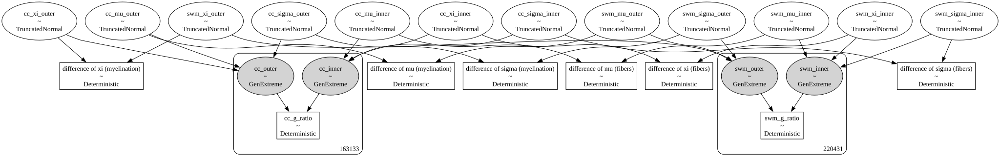

In [19]:
# Visualize the model architecture
pm.model_to_graphviz(model)


In [20]:
trace_prior = pm.sample_prior_predictive(samples=200, model=model,random_seed=42,)

Sampling: [cc_inner, cc_mu_inner, cc_mu_outer, cc_outer, cc_sigma_inner, cc_sigma_outer, cc_xi_inner, cc_xi_outer, swm_inner, swm_mu_inner, swm_mu_outer, swm_outer, swm_sigma_inner, swm_sigma_outer, swm_xi_inner, swm_xi_outer]


In [21]:
trace_prior

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

In [22]:
# extract GEV priors (inner, SWM)
swm_mu_inner_prior = az.extract_dataset(trace_prior.prior)["swm_mu_inner"].to_numpy()
swm_sigma_inner_prior = az.extract_dataset(trace_prior.prior)["swm_sigma_inner"].to_numpy()
swm_xi_inner_prior = az.extract_dataset(trace_prior.prior)["swm_xi_inner"].to_numpy()

# extract GEV priors (outer, SWM)
swm_mu_outer_prior = az.extract_dataset(trace_prior.prior)["swm_mu_outer"].to_numpy()
swm_sigma_outer_prior = az.extract_dataset(trace_prior.prior)["swm_sigma_outer"].to_numpy()
swm_xi_outer_prior = az.extract_dataset(trace_prior.prior)["swm_xi_outer"].to_numpy()

# extract GEV priors (inner, CC)
cc_mu_inner_prior = az.extract_dataset(trace_prior.prior)["cc_mu_inner"].to_numpy()
cc_sigma_inner_prior = az.extract_dataset(trace_prior.prior)["cc_sigma_inner"].to_numpy()
cc_xi_inner_prior = az.extract_dataset(trace_prior.prior)["cc_xi_inner"].to_numpy()

# extract GEV priors (outer, CC)
cc_mu_outer_prior = az.extract_dataset(trace_prior.prior)["cc_mu_outer"].to_numpy()
cc_sigma_outer_prior = az.extract_dataset(trace_prior.prior)["cc_sigma_outer"].to_numpy()
cc_xi_outer_prior = az.extract_dataset(trace_prior.prior)["cc_xi_outer"].to_numpy()

C:\Users\Hoellenmaschine2\AppData\Local\Temp\ipykernel_31660\3576262195.py:2: FutureWarning: extract_dataset has been deprecated, please use extract
  swm_mu_inner_prior = az.extract_dataset(trace_prior.prior)["swm_mu_inner"].to_numpy()
C:\Users\Hoellenmaschine2\AppData\Local\Temp\ipykernel_31660\3576262195.py:3: FutureWarning: extract_dataset has been deprecated, please use extract
  swm_sigma_inner_prior = az.extract_dataset(trace_prior.prior)["swm_sigma_inner"].to_numpy()
C:\Users\Hoellenmaschine2\AppData\Local\Temp\ipykernel_31660\3576262195.py:4: FutureWarning: extract_dataset has been deprecated, please use extract
  swm_xi_inner_prior = az.extract_dataset(trace_prior.prior)["swm_xi_inner"].to_numpy()
C:\Users\Hoellenmaschine2\AppData\Local\Temp\ipykernel_31660\3576262195.py:7: FutureWarning: extract_dataset has been deprecated, please use extract
  swm_mu_outer_prior = az.extract_dataset(trace_prior.prior)["swm_mu_outer"].to_numpy()
C:\Users\Hoellenmaschine2\AppData\Local\Temp\i

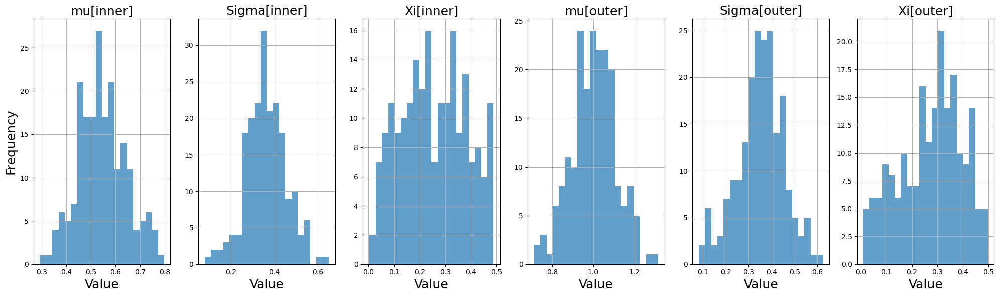

In [23]:
n_bins=20

# Create subplots of prior samples for SWM
fig, axes = plt.subplots(1, 6, figsize=(20, 6),dpi=100)
# Plot the histogram of beta_prior
axes[0].hist(swm_mu_inner_prior, bins=n_bins,alpha=0.7)
axes[0].set_title('mu[inner]',fontsize=18)
axes[0].set_xlabel('Value',fontsize=18)
axes[0].set_ylabel('Frequency',fontsize=18)
axes[0].grid(True)

# Plot the histogram of sigma_prior
axes[1].hist(swm_sigma_inner_prior, bins=n_bins, alpha=0.7)
axes[1].set_title('Sigma[inner]',fontsize=18)
axes[1].set_xlabel('Value',fontsize=18)
# axes[1].set_ylabel('Frequency')
axes[1].grid(True)

# Plot the histogram of xi_prior
axes[2].hist(swm_xi_inner_prior, bins=n_bins,alpha=0.7)
axes[2].set_title('Xi[inner]',fontsize=18)
axes[2].set_xlabel('Value',fontsize=18)
# axes[2].set_ylabel('Frequency')
axes[2].grid(True)

# Plot the histogram of mu_outer_prior
axes[3].hist(swm_mu_outer_prior, bins=n_bins,alpha=0.7)
axes[3].set_title('mu[outer]',fontsize=18)
axes[3].set_xlabel('Value',fontsize=18)
# axes[3].set_ylabel('Frequency')
axes[3].grid(True)

# Plot the histogram of sigma_outer_prior
axes[4].hist(swm_sigma_outer_prior, bins=n_bins,alpha=0.7)
axes[4].set_title('Sigma[outer]',fontsize=18)
axes[4].set_xlabel('Value',fontsize=18)
# axes[4].set_ylabel('Frequency')
axes[4].grid(True)

# Plot the histogram of xi_outer_prior
axes[5].hist(swm_xi_outer_prior, bins=n_bins,alpha=0.7)
axes[5].set_title('Xi[outer]',fontsize=18)
axes[5].set_xlabel('Value',fontsize=18)
# axes[5].set_ylabel('Frequency')
axes[5].grid(True)

plt.tight_layout()
plt.show()

In [24]:
trace_prior

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

#### Prior predictive check

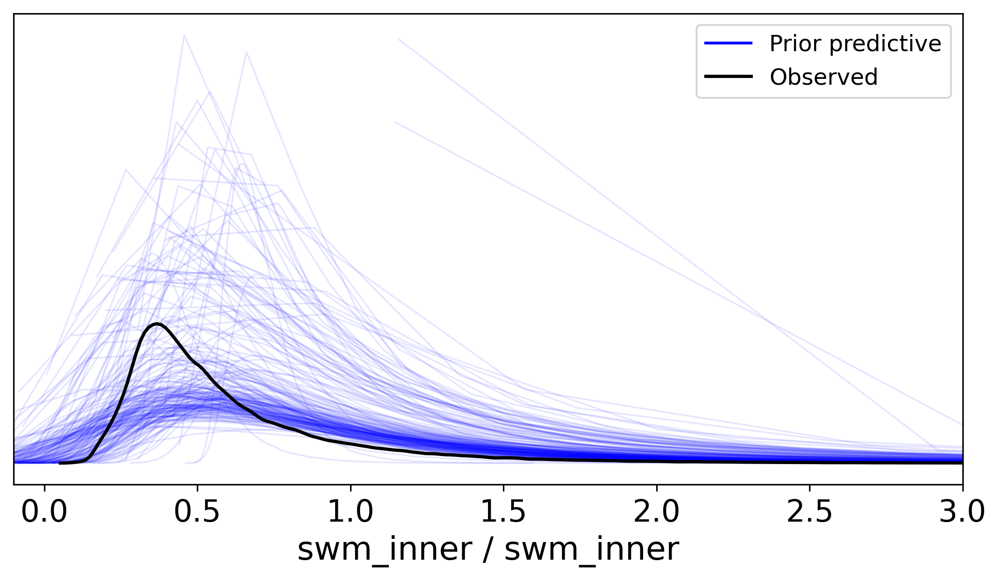

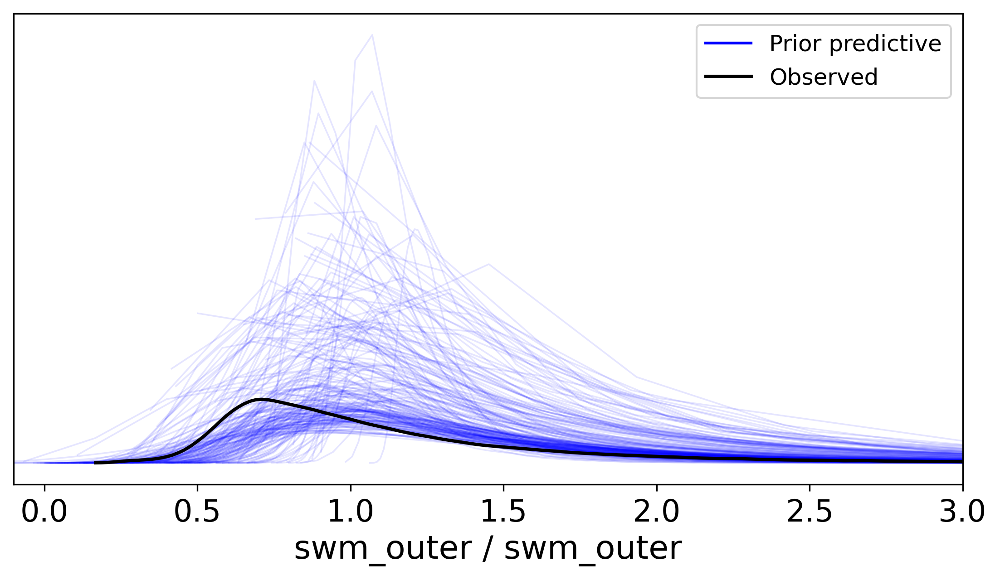

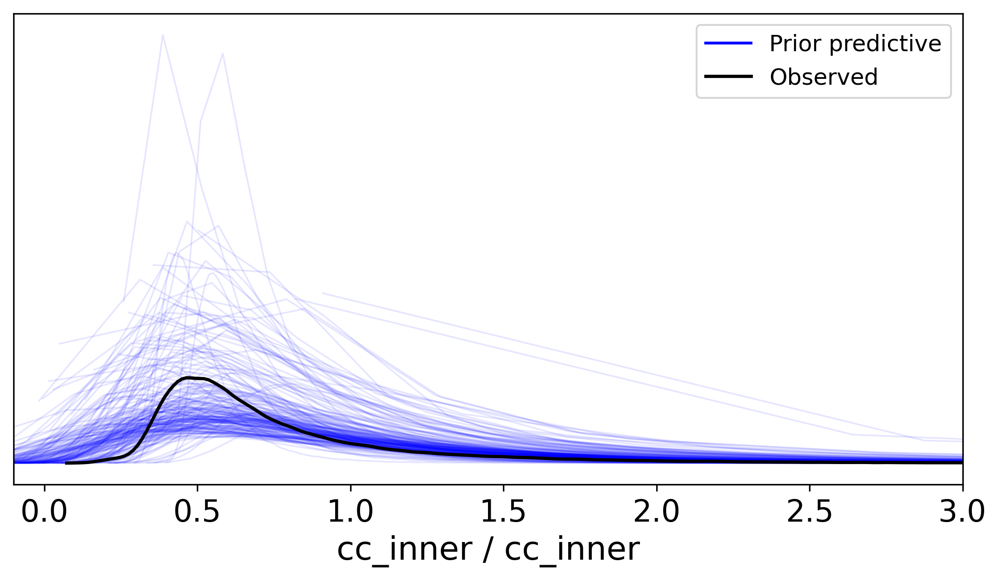

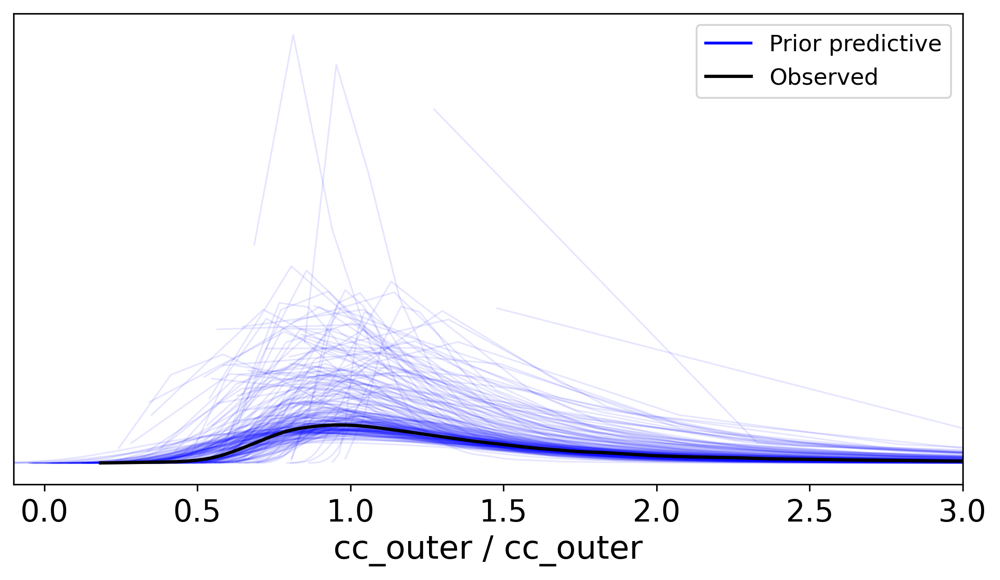

In [25]:
az.plot_ppc(trace_prior, group="prior", figsize=(9, 4.5),colors=['blue','black','orange'],alpha=0.1,var_names=["swm_inner",],mean=False)
plt.xlim(-0.1, 3)
plt.show()

az.plot_ppc(trace_prior, group="prior", figsize=(9, 4.5),colors=['blue','black','orange'],alpha=0.1,var_names=["swm_outer",],mean=False)
plt.xlim(-0.1, 3)
plt.show()

az.plot_ppc(trace_prior, group="prior", figsize=(9, 4.5),colors=['blue','black','orange'],alpha=0.1,var_names=["cc_inner",],mean=False)
plt.xlim(-0.1, 3)
plt.show()

az.plot_ppc(trace_prior, group="prior", figsize=(9, 4.5),colors=['blue','black','orange'],alpha=0.1,var_names=["cc_outer",],mean=False)
plt.xlim(-0.1, 3)
plt.show()

#### Perform sampling using NUTS sampler

In [ ]:
# Perform MCMC sampling 
with model:
    trace = pm.sample(draws=4000,
                      tune=500,
                      chains=4,
                      cores=4,
                      random_seed=42,
                      )

In [ ]:
# save inference data
trace.to_netcdf(r"trace_CCvsSWM_resub.nc")

In [28]:
# re-open inference data
trace = az.from_netcdf(r"trace_CCvsSWM_resub.nc")

In [29]:
# Get the posterior mean and standard deviation of the parameters
swm_mean_mu_inner = np.mean(trace['posterior']['swm_mu_inner'])
swm_mean_sigma_inner = np.mean(trace['posterior']['swm_sigma_inner'])
swm_mean_xi_inner = np.mean(trace['posterior']['swm_xi_inner']*(-1)) # scipy uses the opposite sign for xi

swm_mean_mu_outer = np.mean(trace['posterior']['swm_mu_outer'])
swm_mean_sigma_outer = np.mean(trace['posterior']['swm_sigma_outer'])
swm_mean_xi_outer = np.mean(trace['posterior']['swm_xi_outer']*(-1))

cc_mean_mu_inner = np.mean(trace['posterior']['cc_mu_inner'])
cc_mean_sigma_inner = np.mean(trace['posterior']['cc_sigma_inner'])
cc_mean_xi_inner = np.mean(trace['posterior']['cc_xi_inner']*(-1))

cc_mean_mu_outer = np.mean(trace['posterior']['cc_mu_outer'])
cc_mean_sigma_outer = np.mean(trace['posterior']['cc_sigma_outer'])
cc_mean_xi_outer = np.mean(trace['posterior']['cc_xi_outer']*(-1)) 

#### Plotting Modelling outcomes

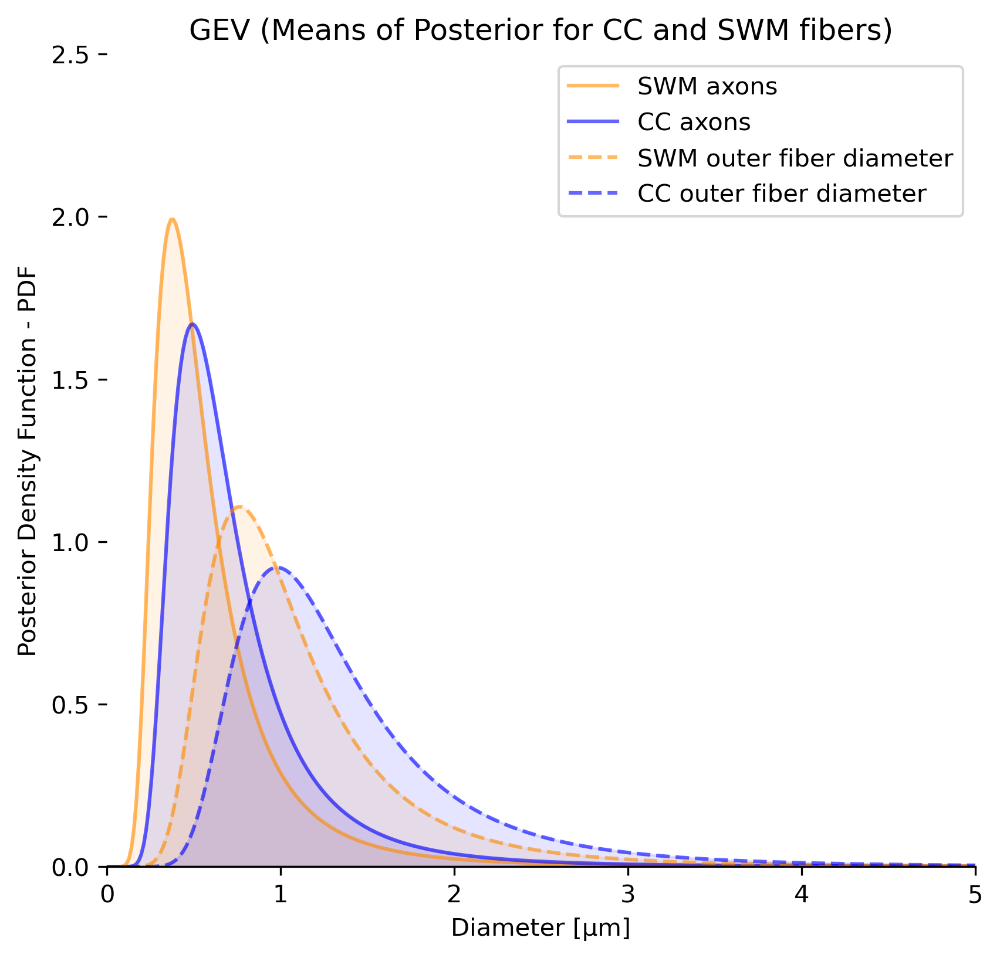

In [30]:
# Define the x range
x = np.linspace(0, np.max(data_swm["inner_axis_minor_length"]) * 2, 1000)

# Plotting GEV fittings for inner_axis_minor_length
plt.figure(figsize=(14, 6))

# Subplot for inner_axis_minor_length
ax = plt.subplot(1, 2, 1)

# Calculate PDFs
pdf_gev_swm_inner = genextreme.pdf(x, swm_mean_xi_inner,
                                   loc=swm_mean_mu_inner,
                                   scale=swm_mean_sigma_inner)

pdf_gev_cc_inner = genextreme.pdf(x, cc_mean_xi_inner,
                                  loc=cc_mean_mu_inner,
                                  scale=cc_mean_sigma_inner)

pdf_gev_swm_outer = genextreme.pdf(x, swm_mean_xi_outer,
                                   loc=swm_mean_mu_outer,
                                   scale=swm_mean_sigma_outer)

pdf_gev_cc_outer = genextreme.pdf(x, cc_mean_xi_outer,
                                  loc=cc_mean_mu_outer,
                                  scale=cc_mean_sigma_outer)

# Plot the curves and fill the area below
plt.plot(x, pdf_gev_swm_inner, label='SWM axons', alpha=0.6, color='darkorange')
plt.fill_between(x, 0, pdf_gev_swm_inner, color='darkorange', alpha=0.1)

plt.plot(x, pdf_gev_cc_inner, label='CC axons', alpha=0.6, color='blue')
plt.fill_between(x, 0, pdf_gev_cc_inner, color='blue', alpha=0.1)

plt.plot(x, pdf_gev_swm_outer, label='SWM outer fiber diameter', alpha=0.6, color='darkorange', ls="--")
plt.fill_between(x, 0, pdf_gev_swm_outer, color='darkorange', alpha=0.1)

plt.plot(x, pdf_gev_cc_outer, label='CC outer fiber diameter', alpha=0.6, color='blue', ls="--")
plt.fill_between(x, 0, pdf_gev_cc_outer, color='blue', alpha=0.1)

plt.xlim(0, 5)
plt.ylim(0, 2.5)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)

plt.legend()
plt.title('GEV (Means of Posterior for CC and SWM fibers)')
plt.xlabel('Diameter [µm]')
plt.ylabel('Posterior Density Function - PDF')
plt.show()

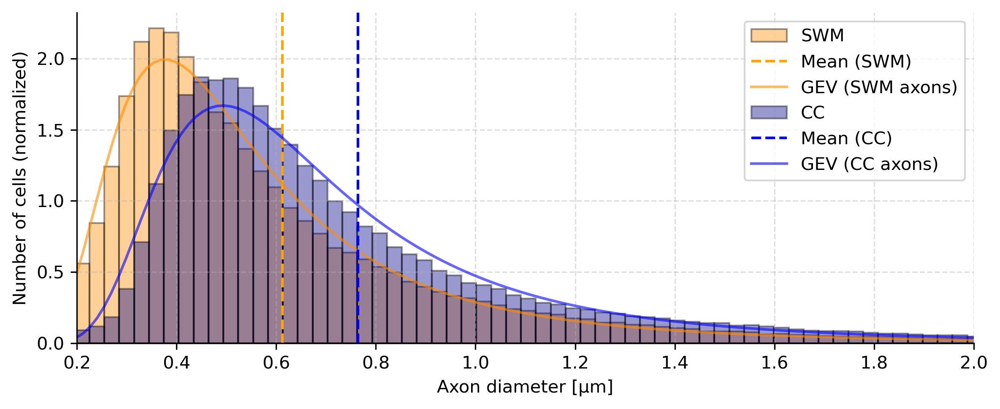

Mean axon Diameter (CC): 0.7638205452281804
Mean axon Diameter (SWM): 0.6125829010918008
Mean Ratio SWM/CC: 0.8019984601341149
Median axon Diameter (CC): 0.6185049734631669
Median axon Diameter (SWM): 0.4926073412122325
Median Ratio SWM/CC: 0.7964484722798565


In [31]:
# visualize raw data with fitted GEV -- axon diameters
fig, ax = plt.subplots(figsize=(8, 5*2/3))

bins = np.linspace(min(min(data_swm['inner_axis_minor_length']), min(data_cc['inner_axis_minor_length'])),
                   max(max(data_swm['inner_axis_minor_length']), max(data_cc['inner_axis_minor_length'])), 250)

# Plot for swm
ax.hist(data_swm['inner_axis_minor_length'], bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
ax.axvline(data_swm['inner_axis_minor_length'].mean(), color='orange', linestyle='--', label='Mean (SWM)')

ax.plot(x, pdf_gev_swm_inner, label='GEV (SWM axons)', alpha=0.6, color='darkorange')

# Plot for cc
ax.hist(data_cc['inner_axis_minor_length'], bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
ax.axvline(data_cc['inner_axis_minor_length'].mean(), color='blue', linestyle='--', label='Mean (CC)')

ax.plot(x, pdf_gev_cc_inner, label='GEV (CC axons)', alpha=0.6, color='blue')

# Customize plot elements
ax.set_ylabel('Number of cells (normalized)')
ax.set_xlabel('Axon diameter [µm]')
ax.set_xlim(0.2,2)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.tight_layout()
plt.show()

print(f"Mean axon Diameter (CC): {data_cc['inner_axis_minor_length'].mean()}")
print(f"Mean axon Diameter (SWM): {data_swm['inner_axis_minor_length'].mean()}")
print(f"Mean Ratio SWM/CC: {data_swm['inner_axis_minor_length'].mean()/data_cc['inner_axis_minor_length'].mean()}")

# print the same for median values
print(f"Median axon Diameter (CC): {data_cc['inner_axis_minor_length'].median()}")
print(f"Median axon Diameter (SWM): {data_swm['inner_axis_minor_length'].median()}")
print(f"Median Ratio SWM/CC: {data_swm['inner_axis_minor_length'].median()/data_cc['inner_axis_minor_length'].median()}")


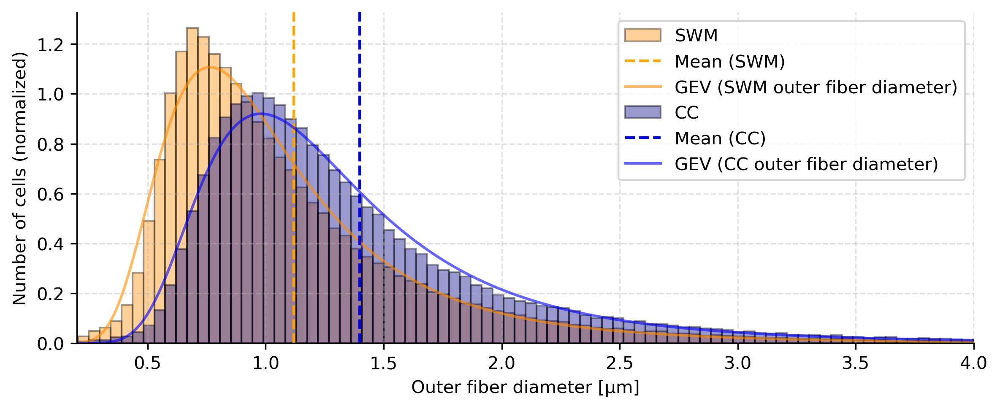

Mean myelin Diameter (CC): 1.3989273113672138
Mean myelin Diameter (SWM): 1.1197893777804133
Mean Ratio SWM/CC: 0.8004628751482515
Median myelin Diameter (CC): 1.1910086443962964
Median myelin Diameter (SWM): 0.9430928199897342
Median Ratio SWM/CC: 0.7918438077061759


In [32]:
# visualize raw data with fitted GEV -- outer fiber diameter
fig, ax = plt.subplots(figsize=(8, 5*2/3))

bins = np.linspace(min(min(data_swm['outer_axis_minor_length']), min(data_cc['outer_axis_minor_length'])),
                   max(max(data_swm['outer_axis_minor_length']), max(data_cc['outer_axis_minor_length'])), 250)

# Plot for swm
ax.hist(data_swm['outer_axis_minor_length'], bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
ax.axvline(data_swm['outer_axis_minor_length'].mean(), color='orange', linestyle='--', label='Mean (SWM)')
ax.plot(x, pdf_gev_swm_outer, label='GEV (SWM outer fiber diameter)', alpha=0.6, color='darkorange',)

# Plot for cc
ax.hist(data_cc['outer_axis_minor_length'], bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
ax.axvline(data_cc['outer_axis_minor_length'].mean(), color='blue', linestyle='--', label='Mean (CC)')
ax.plot(x, pdf_gev_cc_outer, label='GEV (CC outer fiber diameter)', alpha=0.6, color='blue',)

# Customize plot elements
ax.set_ylabel('Number of cells (normalized)')
ax.set_xlabel('Outer fiber diameter [µm]')
ax.set_xlim(0.2,4)
ax.grid(True, linestyle='--', alpha=0.4, which='both')
ax.legend()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.show()

print(f"Mean myelin Diameter (CC): {data_cc['outer_axis_minor_length'].mean()}")
print(f"Mean myelin Diameter (SWM): {data_swm['outer_axis_minor_length'].mean()}")
print(f"Mean Ratio SWM/CC: {data_swm['outer_axis_minor_length'].mean()/data_cc['outer_axis_minor_length'].mean()}")

# print the same for median values
print(f"Median myelin Diameter (CC): {data_cc['outer_axis_minor_length'].median()}")
print(f"Median myelin Diameter (SWM): {data_swm['outer_axis_minor_length'].median()}")
print(f"Median Ratio SWM/CC: {data_swm['outer_axis_minor_length'].median()/data_cc['outer_axis_minor_length'].median()}")

In [33]:
# Calculate conduction velocity according to Rushton et al (1951) Knösche (2019) 
cc_speeds = [] # initialize empty list
for index, row in data_cc.iterrows():
    axon_diameter = row['inner_axis_minor_length']
    gratio = row['gratio']
    if gratio == 0.0:
        continue
    velocity = calculate_connection_velocity_rushton(axon_diameter, gratio)
    cc_speeds.append(velocity)

swm_speeds = [] # initialize empty list
for index, row in data_swm.iterrows():
    axon_diameter = row['inner_axis_minor_length']
    gratio = row['gratio']
    if gratio == 0.0:
        continue
    velocity = calculate_connection_velocity_rushton(axon_diameter, gratio)
    swm_speeds.append(velocity)


#### Figure 2

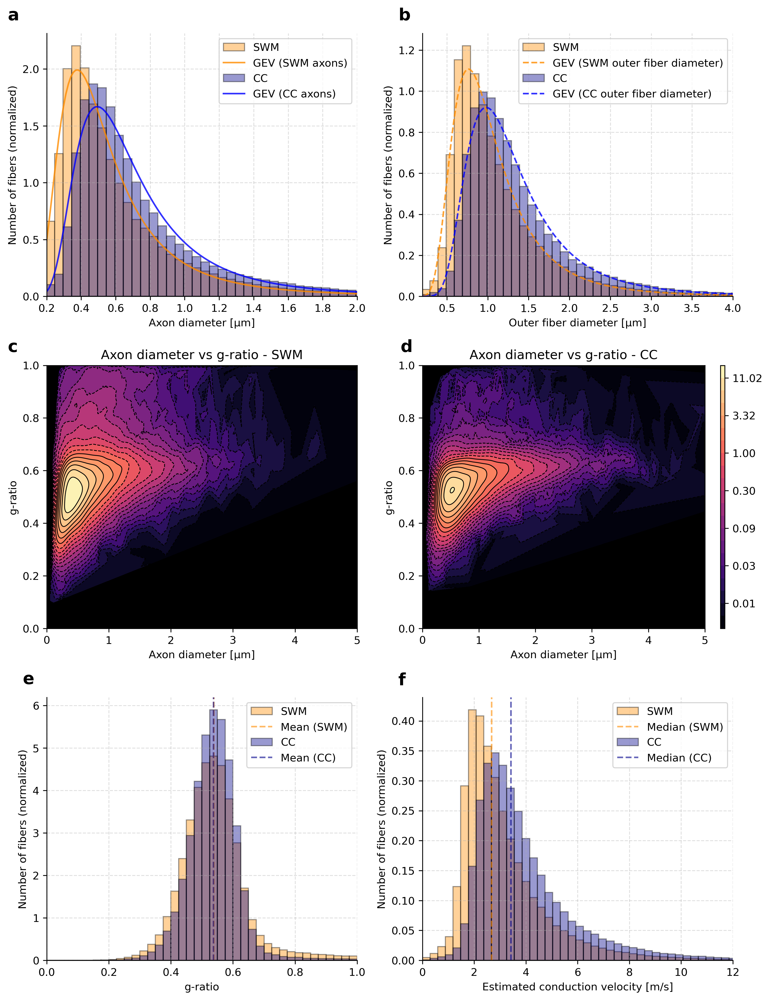

In [34]:
# Function to format the colorbar ticks with exponentiated values
def exp_format_func(value,ticker):
    return f'{np.exp(value):.2f}'

def autolabel(rects,panel):
    """Attach a text label above each bar in *rects*, displaying its height and standard deviation."""
    for rect in rects:
        height = rect.get_height()
        label = f"{height:.2f}".lstrip('0')
        ax[panel].annotate(label,
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

# Initialize Figure 2
ax = plt.figure(figsize=(8.5*1.2,11*1.2),dpi=300).subplot_mosaic(
    """
    AAABBB
    AAABBB
    AAABBB
    CCCDDD
    CCCDDD
    CCCDDD
    EEEHHH
    EEEHHH
    EEEHHH
    """)

# A
bins = np.linspace(min(min(data_swm['inner_axis_minor_length']), min(data_cc['inner_axis_minor_length'])),
                   max(max(data_swm['inner_axis_minor_length']), max(data_cc['inner_axis_minor_length'])), 150)

# Plot for swm
ax["A"].hist(data_swm['inner_axis_minor_length'], bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# ax["A"].axvline(data_swm['inner_axis_minor_length'].mean(), color='orange', linestyle='--', label='Mean (SWM)')
ax["A"].plot(x, pdf_gev_swm_inner, label='GEV (SWM axons)', alpha=0.8, color='darkorange')

# ["A"]Plot for cc
ax["A"].hist(data_cc['inner_axis_minor_length'], bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# ax["A"].axvline(data_cc['inner_axis_minor_length'].mean(), color='blue', linestyle='--', label='Mean (CC)')

ax["A"].plot(x, pdf_gev_cc_inner, label='GEV (CC axons)', alpha=0.8, color='blue')

# ["A"]Customize plot elements
ax["A"].set_ylabel('Number of fibers (normalized)')
ax["A"].set_xlabel('Axon diameter [µm]')
ax["A"].set_xlim(0.2,2)
ax["A"].grid(True, linestyle='--', alpha=0.4, which='both')
ax["A"].legend()
ax["A"].spines['right'].set_visible(False)
ax["A"].spines['top'].set_visible(False)

# B
# bins = np.linspace(min(min(data_swm['outer_axis_minor_length']), min(data_cc['outer_axis_minor_length'])),
#                    max(max(data_swm['outer_axis_minor_length']), max(data_cc['outer_axis_minor_length'])), 150)
bins = bins*2

# Plot for swm
ax["B"].hist(data_swm['outer_axis_minor_length'], bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# ax["B"].axvline(data_swm['outer_axis_minor_length'].mean(), color='orange', linestyle='--', label='Mean (SWM)')
ax["B"].plot(x, pdf_gev_swm_outer, label='GEV (SWM outer fiber diameter)', alpha=0.8, color='darkorange',linestyle="--")

# ["B"]Plot for cc
ax["B"].hist(data_cc['outer_axis_minor_length'], bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# ax["B"].axvline(data_cc['outer_axis_minor_length'].mean(), color='blue', linestyle='--', label='Mean (CC)')
ax["B"].plot(x, pdf_gev_cc_outer, label='GEV (CC outer fiber diameter)', alpha=0.8, color='blue',linestyle="--")

# ["B"]Customize plot elements
ax["B"].set_ylabel('Number of fibers (normalized)')
ax["B"].set_xlabel('Outer fiber diameter [µm]')
ax["B"].set_xlim(0.2,4)
ax["B"].grid(True, linestyle='--', alpha=0.4, which='both')
ax["B"].legend()

ax["B"].spines['right'].set_visible(False)
ax["B"].spines['top'].set_visible(False)

# C
# Extracting data for swm
x_swm = data_swm['inner_axis_minor_length'].values.reshape(-1, 1)
y_swm = data_swm['gratio'].values.reshape(-1, 1)

x_swm_sub = x_swm[::5,0]# use a subset only
y_swm_sub = y_swm[::5,0]

# Compute KDE
values = np.vstack([x_swm_sub, y_swm_sub])
kde = gaussian_kde(values)
z = np.log(kde(values))

# Create the plot
ax["C"].tricontour(x_swm_sub, y_swm_sub, z, levels=22, linewidths=0.75, colors='k')
cntr = ax["C"].tricontourf(x_swm_sub, y_swm_sub, z, levels=22,cmap="magma")
# Colorbar and scatter plot
ax["C"].set(xlim=(0, 5), ylim=(0, 1))
ax["C"].set_facecolor('black')
ax["C"].set_ylabel('g-ratio')
ax["C"].set_xlabel('Axon diameter [µm]')
ax["C"].set_title('Axon diameter vs g-ratio - SWM')

# D
# Extracting data for cc
x_cc = data_cc['inner_axis_minor_length'].values.reshape(-1, 1)
y_cc = data_cc['gratio'].values.reshape(-1, 1)

x_cc_sub = x_cc[::5,0]# use a subset only
y_cc_sub = y_cc[::5,0]

# Compute KDE
values = np.vstack([x_cc_sub, y_cc_sub])
kde = gaussian_kde(values)
z = np.log(kde(values))

# Create the plot
ax["D"].tricontour(x_cc_sub, y_cc_sub, z, levels=22, linewidths=0.75, colors='k')
cntr = ax["D"].tricontourf(x_cc_sub, y_cc_sub, z, levels=22,cmap="magma")
ax["D"].set(xlim=(0, 5), ylim=(0, 1))
ax["D"].set_facecolor('black')
ax["D"].set_ylabel('g-ratio')
ax["D"].set_xlabel('Axon diameter [µm]')
ax["D"].set_title('Axon diameter vs g-ratio - CC')

# Add a colorbar with exponentiated values
cbar = fig.colorbar(cntr, ax=ax["D"], orientation='vertical', fraction=0.04,aspect=60)
cbar.formatter = FuncFormatter(exp_format_func)
cbar.update_ticks()

# E
# plot g ratio distributions
swm_mean = data_swm['gratio'].mean()
cc_mean = data_cc['gratio'].mean()
ax["E"].hist(data_swm['gratio'], bins=np.linspace(0, 1, 41), edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
ax["E"].axvline(swm_mean, color='darkorange', linestyle='--',alpha = 0.6, label='Mean (SWM)')
ax["E"].hist(data_cc['gratio'], bins=np.linspace(0, 1, 41), edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
ax["E"].axvline(cc_mean, color='darkblue', linestyle='--',alpha = 0.6, label='Mean (CC)')
ax["E"].set_ylabel('Number of fibers (normalized)')
ax["E"].set_xlabel('g-ratio')
ax["E"].set_xlim((0,1))
ax["E"].grid(True, linestyle='--', alpha=0.4, which='both')
ax["E"].legend()
ax["E"].spines['right'].set_visible(False)
ax["E"].spines['top'].set_visible(False)

#H
ax["H"].hist(swm_speeds, bins=np.linspace(0, 16, 55), edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
ax["H"].axvline(np.median(swm_speeds), color='darkorange', linestyle='--',alpha = 0.6, label='Median (SWM)')
ax["H"].hist(cc_speeds, bins=np.linspace(0, 16, 55), edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
ax["H"].axvline(np.median(cc_speeds), color='darkblue', linestyle='--',alpha = 0.6, label='Median (CC)')
# bins = np.linspace(0, 16, 55)
# swm_counts, _ = np.histogram(swm_speeds, bins=bins)
# cc_counts, _ = np.histogram(cc_speeds, bins=bins)
# swm_mode_bin = (bins[np.argmax(swm_counts)] + bins[np.argmax(swm_counts) + 1]) / 2
# cc_mode_bin = (bins[np.argmax(cc_counts)] + bins[np.argmax(cc_counts) + 1]) / 2

# ax["H"].hist(swm_speeds, bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# ax["H"].axvline(swm_mode_bin, color='darkorange', linestyle='--', alpha=0.6, label='Mode (SWM)')
# ax["H"].hist(cc_speeds, bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# ax["H"].axvline(cc_mode_bin, color='darkblue', linestyle='--', alpha=0.6, label='Mode (CC)')

# set parameters for plot
ax["H"].set_ylabel('Number of fibers (normalized)')
ax["H"].set_xlabel('Estimated conduction velocity [m/s]')
ax["H"].set_xlim((0,12))
ax["H"].grid(True, linestyle='--', alpha=0.4, which='both')
ax["H"].legend()
ax["H"].spines['right'].set_visible(False)
ax["H"].spines['top'].set_visible(False)

# add A-F labels (thanks pylustrator!!)
plt.figure(1).ax_dict = {ax.get_label(): ax for ax in plt.figure(1).axes}
getattr(plt.figure(1), '_pylustrator_init', lambda: ...)()
plt.figure(1).ax_dict["A"].text(-0.1558+0.03, 1.0202+0.03, 'a', transform=plt.figure(1).ax_dict["A"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["A"].texts[0].new
plt.figure(1).ax_dict["B"].text(-0.1073+0.03, 1.0202+0.03, 'b', transform=plt.figure(1).ax_dict["B"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["B"].texts[0].new
plt.figure(1).ax_dict["C"].text(-0.1558+0.03, 1.0215+0.03, 'c', transform=plt.figure(1).ax_dict["C"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["C"].texts[0].new
plt.figure(1).ax_dict["D"].text(-0.1073+0.03, 1.0215+0.03, 'd', transform=plt.figure(1).ax_dict["D"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["D"].texts[0].new
plt.figure(1).ax_dict["E"].text(-0.1073+0.03, 1.0215+0.03, 'e', transform=plt.figure(1).ax_dict["E"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["E"].texts[6].new
plt.figure(1).ax_dict["H"].text(-0.1073+0.03, 1.0175+0.03, 'f', transform=plt.figure(1).ax_dict["H"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["F"].texts[0].new
plt.tight_layout()
plt.show()

In [35]:
np.median(swm_speeds)

2.675321856944425

In [36]:
np.median(cc_speeds)

3.4217472366357287

In [37]:
### Alternative version of Figure 2 with measurements taken from equivalent circle measurements

# # Function to format the colorbar ticks with exponentiated values
# def exp_format_func(value,ticker):
#     return f'{np.exp(value):.2f}'

# def autolabel(rects,panel):
#     """Attach a text label above each bar in *rects*, displaying its height and standard deviation."""
#     for rect in rects:
#         height = rect.get_height()
#         label = f"{height:.2f}".lstrip('0')
#         ax[panel].annotate(label,
#                     xy=(rect.get_x() + rect.get_width() / 2, height),
#                     xytext=(0, 3),  # 3 points vertical offset
#                     textcoords="offset points",
#                     ha='center', va='bottom')

# # Initialize Figure 2
# ax = plt.figure(figsize=(8.5*1.2,11*1.2),dpi=300).subplot_mosaic(
#     """
#     AAABBB
#     AAABBB
#     AAABBB
#     CCCDDD
#     CCCDDD
#     CCCDDD
#     EEEHHH
#     EEEHHH
#     EEEHHH
#     """)

# # A
# bins = np.linspace(min(min(data_swm['inner_axis_minor_length']), min(data_cc['inner_axis_minor_length'])),
#                    max(max(data_swm['inner_axis_minor_length']), max(data_cc['inner_axis_minor_length'])), 150)

# # Plot for swm
# ax["A"].hist(data_swm['inner_axis_minor_length'], bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# # ax["A"].axvline(data_swm['inner_axis_minor_length'].mean(), color='orange', linestyle='--', label='Mean (SWM)')
# ax["A"].plot(x, pdf_gev_swm_inner, label='GEV (SWM axons)', alpha=0.8, color='darkorange')

# # ["A"]Plot for cc
# ax["A"].hist(data_cc['inner_axis_minor_length'], bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# # ax["A"].axvline(data_cc['inner_axis_minor_length'].mean(), color='blue', linestyle='--', label='Mean (CC)')

# ax["A"].plot(x, pdf_gev_cc_inner, label='GEV (CC axons)', alpha=0.8, color='blue')

# # ["A"]Customize plot elements
# ax["A"].set_ylabel('Number of cells (normalized)')
# ax["A"].set_xlabel('Axon diameter [µm]')
# ax["A"].set_xlim(0.2,2)
# ax["A"].grid(True, linestyle='--', alpha=0.4, which='both')
# ax["A"].legend()
# ax["A"].spines['right'].set_visible(False)
# ax["A"].spines['top'].set_visible(False)

# # B
# # bins = np.linspace(min(min(data_swm['outer_axis_minor_length']), min(data_cc['outer_axis_minor_length'])),
# #                    max(max(data_swm['outer_axis_minor_length']), max(data_cc['outer_axis_minor_length'])), 150)
# bins = bins*2

# # Plot for swm
# ax["B"].hist(data_swm['outer_axis_minor_length'], bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# # ax["B"].axvline(data_swm['outer_axis_minor_length'].mean(), color='orange', linestyle='--', label='Mean (SWM)')
# ax["B"].plot(x, pdf_gev_swm_outer, label='GEV (SWM outer fiber diameter)', alpha=0.8, color='darkorange',linestyle="--")

# # ["B"]Plot for cc
# ax["B"].hist(data_cc['outer_axis_minor_length'], bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# # ax["B"].axvline(data_cc['outer_axis_minor_length'].mean(), color='blue', linestyle='--', label='Mean (CC)')
# ax["B"].plot(x, pdf_gev_cc_outer, label='GEV (CC outer fiber diameter)', alpha=0.8, color='blue',linestyle="--")

# # ["B"]Customize plot elements
# ax["B"].set_ylabel('Number of cells (normalized)')
# ax["B"].set_xlabel('Outer fiber diameter [µm]')
# ax["B"].set_xlim(0.2,4)
# ax["B"].grid(True, linestyle='--', alpha=0.4, which='both')
# ax["B"].legend()

# ax["B"].spines['right'].set_visible(False)
# ax["B"].spines['top'].set_visible(False)

# # C
# # Extracting data for swm
# x_swm = data_swm['inner_axis_minor_length'].values.reshape(-1, 1)
# y_swm = data_swm['gratio_equivalent_circle'].values.reshape(-1, 1)

# x_swm_sub = x_swm[::5,0]# use a subset only
# y_swm_sub = y_swm[::5,0]

# # Compute KDE
# values = np.vstack([x_swm_sub, y_swm_sub])
# kde = gaussian_kde(values)
# z = np.log(kde(values))

# # Create the plot
# ax["C"].tricontour(x_swm_sub, y_swm_sub, z, levels=22, linewidths=0.75, colors='k')
# cntr = ax["C"].tricontourf(x_swm_sub, y_swm_sub, z, levels=22,cmap="magma")
# # Colorbar and scatter plot
# ax["C"].set(xlim=(0, 5), ylim=(0, 1))
# ax["C"].set_facecolor('black')
# ax["C"].set_ylabel('g-ratio')
# ax["C"].set_xlabel('Axon diameter [µm]')
# ax["C"].set_title('Axon diameter vs g-ratio - SWM')

# # D
# # Extracting data for cc
# x_cc = data_cc['inner_axis_minor_length'].values.reshape(-1, 1)
# y_cc = data_cc['gratio_equivalent_circle'].values.reshape(-1, 1)

# x_cc_sub = x_cc[::5,0]# use a subset only
# y_cc_sub = y_cc[::5,0]

# # Compute KDE
# values = np.vstack([x_cc_sub, y_cc_sub])
# kde = gaussian_kde(values)
# z = np.log(kde(values))

# # Create the plot
# ax["D"].tricontour(x_cc_sub, y_cc_sub, z, levels=22, linewidths=0.75, colors='k')
# cntr = ax["D"].tricontourf(x_cc_sub, y_cc_sub, z, levels=22,cmap="magma")
# ax["D"].set(xlim=(0, 5), ylim=(0, 1))
# ax["D"].set_facecolor('black')
# ax["D"].set_ylabel('g-ratio')
# ax["D"].set_xlabel('Axon diameter [µm]')
# ax["D"].set_title('Axon diameter vs g-ratio - CC')

# # Add a colorbar with exponentiated values
# cbar = fig.colorbar(cntr, ax=ax["D"], orientation='vertical', fraction=0.04,aspect=60)
# cbar.formatter = FuncFormatter(exp_format_func)
# cbar.update_ticks()

# # E
# # plot g ratio distributions
# bins = np.linspace(0, 1, 41)  # 40 bins between 0 and 1
# swm_mean = data_swm['gratio_equivalent_circle'].mean()
# cc_mean = data_cc['gratio_equivalent_circle'].mean()
# ax["E"].hist(data_swm['gratio_equivalent_circle'], bins=bins, edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# ax["E"].axvline(swm_mean, color='darkorange', linestyle='--',alpha = 0.6, label='Mean (SWM)')
# ax["E"].hist(data_cc['gratio_equivalent_circle'], bins=bins, edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# ax["E"].axvline(cc_mean, color='darkblue', linestyle='--',alpha = 0.6, label='Mean (CC)')
# ax["E"].set_ylabel('Number of cells (normalized)')
# ax["E"].set_xlabel('g-ratio')
# ax["E"].set_xlim((0,1))
# ax["E"].grid(True, linestyle='--', alpha=0.4, which='both')
# ax["E"].legend()
# ax["E"].spines['right'].set_visible(False)
# ax["E"].spines['top'].set_visible(False)

# #H
# ax["H"].hist(swm_speeds, bins=np.linspace(0, 16, 55), edgecolor='black', color='darkorange', alpha=0.4, label='SWM', density=True)
# ax["H"].axvline(np.mean(swm_speeds), color='darkorange', linestyle='--',alpha = 0.6, label='Mean (SWM)')
# ax["H"].hist(cc_speeds, bins=np.linspace(0, 16, 55), edgecolor='black', color='darkblue', alpha=0.4, label='CC', density=True)
# ax["H"].axvline(np.mean(cc_speeds), color='darkblue', linestyle='--',alpha = 0.6, label='Mean (CC)')

# # set parameters for plot
# ax["H"].set_ylabel('Number of cells (normalized)')
# ax["H"].set_xlabel('Estimated conduction velocity [m/s]')
# ax["H"].set_xlim((0,12))
# ax["H"].grid(True, linestyle='--', alpha=0.4, which='both')
# ax["H"].legend()
# ax["H"].spines['right'].set_visible(False)
# ax["H"].spines['top'].set_visible(False)

# # add A-F labels (thanks pylustrator!!)
# plt.figure(1).ax_dict = {ax.get_label(): ax for ax in plt.figure(1).axes}
# getattr(plt.figure(1), '_pylustrator_init', lambda: ...)()
# plt.figure(1).ax_dict["A"].text(-0.1558+0.03, 1.0202+0.03, 'a', transform=plt.figure(1).ax_dict["A"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["A"].texts[0].new
# plt.figure(1).ax_dict["B"].text(-0.1073+0.03, 1.0202+0.03, 'b', transform=plt.figure(1).ax_dict["B"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["B"].texts[0].new
# plt.figure(1).ax_dict["C"].text(-0.1558+0.03, 1.0215+0.03, 'c', transform=plt.figure(1).ax_dict["C"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["C"].texts[0].new
# plt.figure(1).ax_dict["D"].text(-0.1073+0.03, 1.0215+0.03, 'd', transform=plt.figure(1).ax_dict["D"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["D"].texts[0].new
# plt.figure(1).ax_dict["E"].text(-0.1073+0.03, 1.0215+0.03, 'e', transform=plt.figure(1).ax_dict["E"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["E"].texts[6].new
# plt.figure(1).ax_dict["H"].text(-0.1073+0.03, 1.0175+0.03, 'f', transform=plt.figure(1).ax_dict["H"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["F"].texts[0].new
# plt.tight_layout()
# plt.show()

#### Figure 3

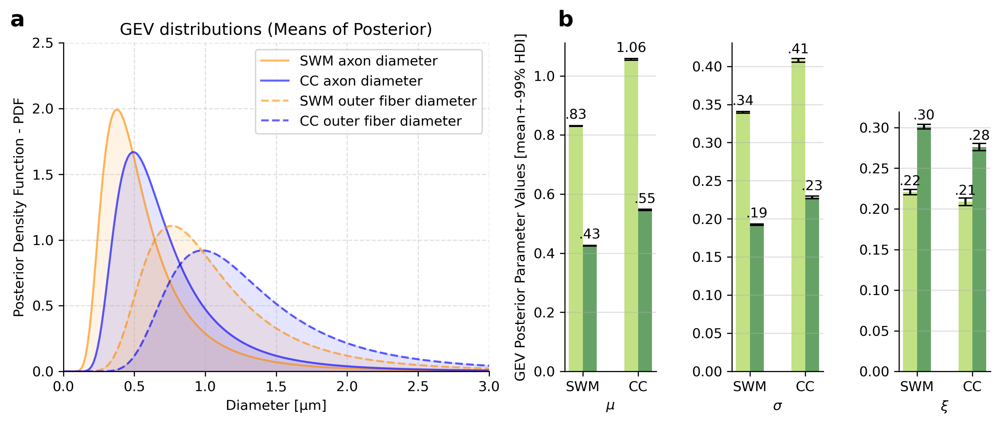

In [39]:
def autolabel(rects,panel):
    """Attach a text label above each bar in *rects*, displaying its height and standard deviation."""
    for rect in rects:
        height = rect.get_height()
        label = f"{height:.2f}".lstrip('0')
        ax[panel].annotate(label,
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

### figure 3
ax = plt.figure(figsize=(8.5*1.2,11*1.2/3),dpi=300).subplot_mosaic(
    """
    AAABC.
    AAABCD
    AAABCD
    AAABCD
    AAABCD
    """)

# Plot GEV curves and fill the area below
ax["A"].plot(x, pdf_gev_swm_inner, label='SWM axon diameter', alpha=0.6, color='darkorange')
ax["A"].fill_between(x, 0, pdf_gev_swm_inner, color='darkorange', alpha=0.1)

ax["A"].plot(x, pdf_gev_cc_inner, label='CC axon diameter', alpha=0.6, color='blue')
ax["A"].fill_between(x, 0, pdf_gev_cc_inner, color='blue', alpha=0.1)

ax["A"].plot(x, pdf_gev_swm_outer, label='SWM outer fiber diameter', alpha=0.6, color='darkorange', ls="--")
ax["A"].fill_between(x, 0, pdf_gev_swm_outer, color='darkorange', alpha=0.1)

ax["A"].plot(x, pdf_gev_cc_outer, label='CC outer fiber diameter', alpha=0.6, color='blue', ls="--")
ax["A"].fill_between(x, 0, pdf_gev_cc_outer, color='blue', alpha=0.1)

# set parameters for plot
ax["A"].set_xlim(0, 3)
ax["A"].set_ylim(0, 2.5)
ax["A"].spines['right'].set_visible(False)
ax["A"].spines['top'].set_visible(False)
ax["A"].legend()
ax["A"].set_title('GEV distributions (Means of Posterior)')
ax["A"].set_xlabel('Diameter [µm]')
ax["A"].set_ylabel('Posterior Density Function - PDF')
ax["A"].grid(True, linestyle='--', alpha=0.4, which='both')

cc_mu_axon_mean = trace["posterior"]["cc_mu_inner"].mean()
cc_si_axon_mean = trace["posterior"]["cc_sigma_inner"].mean()
cc_xi_axon_mean = trace["posterior"]["cc_xi_inner"].mean()
cc_mu_myelin_mean = trace["posterior"]["cc_mu_outer"].mean()
cc_si_myelin_mean = trace["posterior"]["cc_sigma_outer"].mean()
cc_xi_myelin_mean = trace["posterior"]["cc_xi_outer"].mean()

swm_mu_axon_mean = trace["posterior"]["swm_mu_inner"].mean()
swm_si_axon_mean = trace["posterior"]["swm_sigma_inner"].mean()
swm_xi_axon_mean = trace["posterior"]["swm_xi_inner"].mean()
swm_mu_myelin_mean = trace["posterior"]["swm_mu_outer"].mean()
swm_si_myelin_mean = trace["posterior"]["swm_sigma_outer"].mean()
swm_xi_myelin_mean = trace["posterior"]["swm_xi_outer"].mean()

# Data preparation
labels = ['SWM', 'CC']

e_x = np.arange(len(labels))  # the label locations
width = 0.25  # the width of the bars

rects1_a = ax["B"].bar(e_x - width/2, [swm_mu_myelin_mean,cc_mu_myelin_mean], width, label='CC', yerr=((0.5574-0.5547)/2,(1.158-1.152)/2), capsize=5,alpha=0.6,color="yellowgreen")
rects1_m = ax["B"].bar(e_x + width/2, [swm_mu_axon_mean,cc_mu_axon_mean], width, label='SWM', yerr=((0.4566-0.4546)/2,(0.9333-0.9288)/2), capsize=5,alpha=0.6,color="darkgreen")

# Add some text for labels, title and custom x-axis tick labels, etc.
ax["B"].set_ylabel('GEV Posterior Parameter Values [mean+-99% HDI]')
ax["B"].set_xlabel(r'$\mu$')
ax["B"].set_xticks(e_x)
ax["B"].set_xticklabels(labels)
ax["B"].yaxis.grid(True,alpha=0.4)

autolabel(rects1_a,"B")# axon
autolabel(rects1_m,"B")# myelin

ax["B"].spines['top'].set_visible(False)
ax["B"].spines['right'].set_visible(False)

# F
rects2_a = ax["C"].bar(e_x - width/2, [swm_si_myelin_mean,cc_si_myelin_mean], width, label='CC', yerr=((0.2232-0.2211)/2,(0.4553-0.4505)/2), capsize=5,alpha=0.6,color="yellowgreen")
rects2_m = ax["C"].bar(e_x + width/2, [swm_si_axon_mean,cc_si_axon_mean], width, label='SWM', yerr=((0.1536-0.1522)/2,(0.3477-0.344)/2), capsize=5,alpha=0.6,color="darkgreen")

ax["C"].set_xlabel(r'$\sigma$')
ax["C"].set_xticks(e_x)
ax["C"].set_xticklabels(labels)
ax["C"].yaxis.grid(True,alpha=0.4)

autolabel(rects2_a,"C")# axon
autolabel(rects2_m,"C")# myelin

ax["C"].spines['top'].set_visible(False)
ax["C"].spines['right'].set_visible(False)

#G
rects3_a = ax["D"].bar(e_x - width/2, [swm_xi_myelin_mean,cc_xi_myelin_mean], width, label='CC', yerr=((0.2109-0.2045)/2,(0.2707-0.2614)/2), capsize=5,alpha=0.6,color="yellowgreen")
rects3_m = ax["D"].bar(e_x + width/2, [swm_xi_axon_mean,cc_xi_axon_mean], width, label='SWM', yerr=((0.1126-0.1069)/2,(0.2582-0.2495)/2), capsize=5,alpha=0.6,color="darkgreen")

ax["D"].set_xlabel(r'$\xi$')
ax["D"].set_xticks(e_x)
ax["D"].set_xticklabels(labels)
ax["D"].yaxis.grid(True,alpha=0.4)
autolabel(rects3_a,"D")# axon
autolabel(rects3_m,"D")# myelin
ax["D"].spines['top'].set_visible(False)
ax["D"].spines['right'].set_visible(False)
# ax["G"].legend(loc='upper right',)

plt.figure(1).ax_dict = {ax.get_label(): ax for ax in plt.figure(1).axes}
getattr(plt.figure(1), '_pylustrator_init', lambda: ...)()
plt.figure(1).ax_dict["A"].text(-0.1558+0.03, 1.0202+0.03, 'a', transform=plt.figure(1).ax_dict["A"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["A"].texts[0].new
plt.figure(1).ax_dict["B"].text(-0.1073+0.03, 1.0202+0.03, 'b', transform=plt.figure(1).ax_dict["B"].transAxes, fontsize=16., weight='bold')  # id=plt.figure(1).ax_dict["B"].texts[0].new

plt.tight_layout()
plt.show()

In [ ]:
trace["posterior"]

<xarray.Dataset>
Dimensions:                            (chain: 4, draw: 4000,
                                        swm_g_ratio_dim_0: 220431,
                                        cc_g_ratio_dim_0: 163133)
Coordinates:
  * chain                              (chain) int32 0 1 2 3
  * draw                               (draw) int32 0 1 2 3 ... 3997 3998 3999
  * swm_g_ratio_dim_0                  (swm_g_ratio_dim_0) int32 0 1 ... 220430
  * cc_g_ratio_dim_0                   (cc_g_ratio_dim_0) int32 0 1 ... 163132
Data variables: (12/20)
    swm_mu_inner                       (chain, draw) float64 0.4259 ... 0.4256
    swm_sigma_inner                    (chain, draw) float64 0.1925 ... 0.1926
    swm_xi_inner                       (chain, draw) float64 0.3007 ... 0.3033
    cc_mu_inner                        (chain, draw) float64 0.5465 ... 0.5484
    cc_sigma_inner                     (chain, draw) float64 0.2281 ... 0.229
    cc_xi_inner                        (chain, draw) float64 0.2778 ... 0.2758
    ...                                 ...
    difference of mu (fibers)          (chain, draw) float64 ...
    difference of sigma (fibers)       (chain, draw) float64 ...
    difference of xi (fibers)          (chain, draw) float64 ...
    difference of mu (myelination)     (chain, draw) float64 ...
    difference of sigma (myelination)  (chain, draw) float64 ...
    difference of xi (myelination)     (chain, draw) float64 ...
Attributes:
    created_at:                 2025-04-20T09:48:47.402755
    arviz_version:              0.16.1
    inference_library:          pymc
    inference_library_version:  5.10.0
    sampling_time:              12524.402067422867
    tuning_steps:               500

In [ ]:
print(f"Median speed for CC: {np.median(cc_speeds)}")
print(f"Median speed for SWM: {np.median(swm_speeds)}")
print(f"Ratio of CC/SWM median speeds: {np.median(cc_speeds)/np.median(swm_speeds)}")

Median speed for CC: 3.4217472366357287
Median speed for SWM: 2.675321856944425
Ratio of CC/SWM median speeds: 1.279003955263843


#### Inspection of model parameters

In [ ]:
az.summary(trace,var_names=['difference of mu (fibers)',
                            'difference of sigma (fibers)',
                            'difference of xi (fibers)',
                            'difference of mu (myelination)',
                            'difference of sigma (myelination)',
                            'difference of xi (myelination)'],)
                # round_to=2)
                            
# print('') 

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
difference of mu (fibers),0.122,0.001,0.120,0.123,0.0,0.0,18372.0,12090.0,1.0
difference of sigma (fibers),0.036,0.001,0.035,0.037,0.0,0.0,19687.0,13121.0,1.0
difference of xi (fibers),-0.025,0.003,-0.030,-0.020,0.0,0.0,26447.0,12495.0,1.0
difference of mu (myelination),0.226,0.001,0.223,0.228,0.0,0.0,20259.0,13230.0,1.0
difference of sigma (myelination),0.068,0.001,0.066,0.070,0.0,0.0,20266.0,13541.0,1.0
difference of xi (myelination),-0.012,0.002,-0.016,-0.007,0.0,0.0,28824.0,11286.0,1.0


In [ ]:
az.hdi(trace,var_names=['swm_mu_inner',
                            'swm_mu_outer',
                            'cc_mu_inner',
                            'cc_mu_outer',
                            'swm_sigma_inner',
                            'swm_sigma_outer',
                            'cc_sigma_inner',
                            'cc_sigma_outer',
                            'swm_xi_inner',
                            'swm_xi_outer',
                            'cc_xi_inner',
                            'cc_xi_outer',], hdi_prob = 0.99).values()

ValuesView(<xarray.Dataset>
Dimensions:          (hdi: 2)
Coordinates:
  * hdi              (hdi) <U6 'lower' 'higher'
Data variables:
    swm_mu_inner     (hdi) float64 0.4241 0.4266
    swm_mu_outer     (hdi) float64 0.828 0.8322
    cc_mu_inner      (hdi) float64 0.5454 0.5485
    cc_mu_outer      (hdi) float64 1.053 1.059
    swm_sigma_inner  (hdi) float64 0.1914 0.1934
    swm_sigma_outer  (hdi) float64 0.3382 0.3416
    cc_sigma_inner   (hdi) float64 0.227 0.2296
    cc_sigma_outer   (hdi) float64 0.4056 0.4102
    swm_xi_inner     (hdi) float64 0.2965 0.3057
    swm_xi_outer     (hdi) float64 0.2167 0.2248
    cc_xi_inner      (hdi) float64 0.2713 0.2808
    cc_xi_outer      (hdi) float64 0.2042 0.2133)

In [ ]:
az.summary(trace,var_names=['swm_mu_inner',
                            'swm_mu_outer',
                            'cc_mu_inner',
                            'cc_mu_outer',
                            'swm_sigma_inner',
                            'swm_sigma_outer',
                            'cc_sigma_inner',
                            'cc_sigma_outer',
                            'swm_xi_inner',
                            'swm_xi_outer',
                            'cc_xi_inner',
                            'cc_xi_outer',],)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
swm_mu_inner,0.425,0.000,0.424,0.426,0.0,0.0,16800.0,13284.0,1.0
swm_mu_outer,0.830,0.001,0.829,0.832,0.0,0.0,21105.0,12877.0,1.0
cc_mu_inner,0.547,0.001,0.546,0.548,0.0,0.0,19529.0,13030.0,1.0
cc_mu_outer,1.056,0.001,1.054,1.058,0.0,0.0,19516.0,13868.0,1.0
swm_sigma_inner,0.192,0.000,0.192,0.193,0.0,0.0,17338.0,12839.0,1.0
swm_sigma_outer,0.340,0.001,0.339,0.341,0.0,0.0,22769.0,13184.0,1.0
cc_sigma_inner,0.228,0.001,0.227,0.229,0.0,0.0,20648.0,12673.0,1.0
cc_sigma_outer,0.408,0.001,0.406,0.410,0.0,0.0,19773.0,13202.0,1.0
swm_xi_inner,0.301,0.002,0.298,0.305,0.0,0.0,25714.0,11711.0,1.0
swm_xi_outer,0.221,0.002,0.218,0.224,0.0,0.0,27212.0,12005.0,1.0


<Figure size 1920x1440 with 0 Axes>

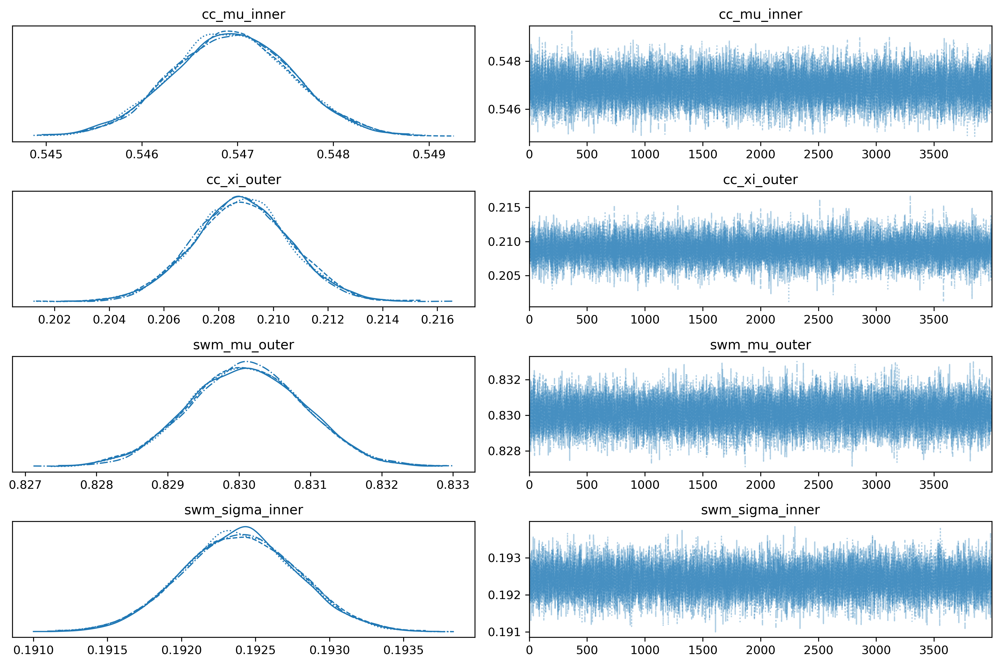

In [ ]:
plt.figure()
axes = az.plot_trace(trace,var_names=['cc_mu_inner','cc_xi_outer',
                                      'swm_mu_outer','swm_sigma_inner',],
                                      figsize=(12,8),
                                      compact=True,
                                      combined=False)
plt.tight_layout()
i=0
for ax in axes.flatten():#
    i+=1
    if i //2 == 0:
        ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3f'))
        ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3f'))
plt.show()

#### Posterior Predictive Check

In [ ]:
## perform a posterior predictive check
ppc = pm.sample_posterior_predictive(trace, model=model)

In [ ]:
# save ppc to file
ppc.to_netcdf(r"posterior_trace_CCvsSWM.nc")
# repoen ppc file
ppc = az.from_netcdf(r"posterior_trace_CCvsSWM.nc")

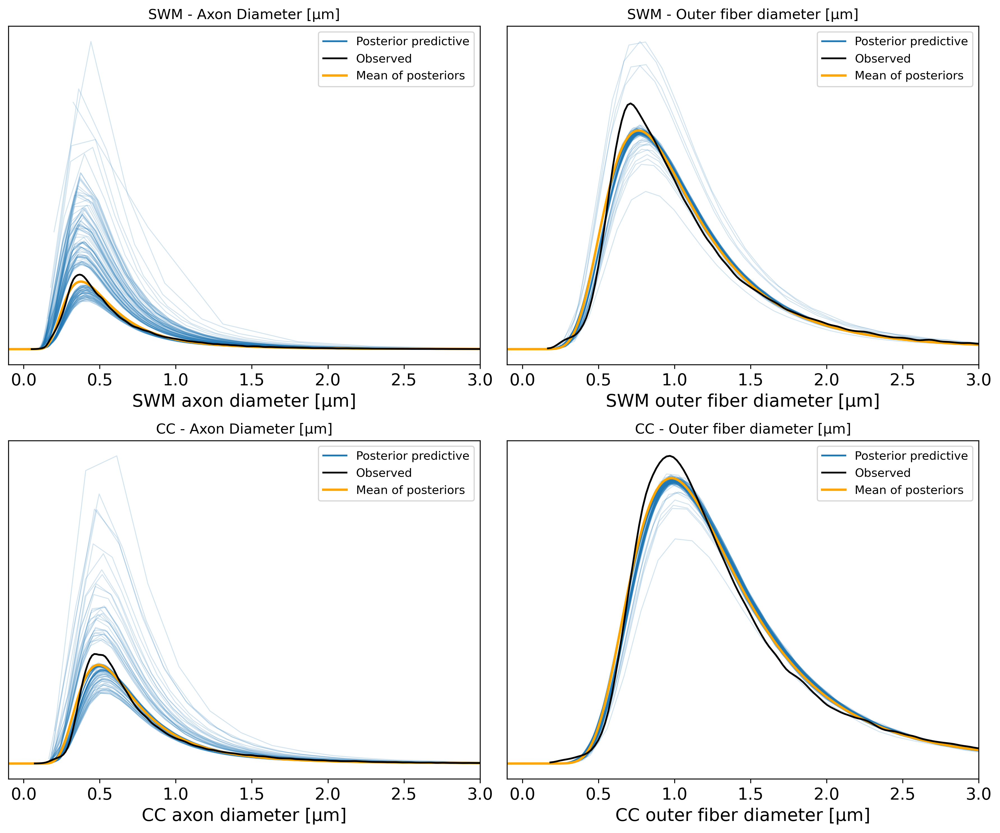

In [ ]:
# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Define x range for PDFs
x = np.linspace(-0.1, 3, 1000)

# Plot PPC and PDFs
az.plot_ppc(ppc, num_pp_samples=150, ax=axes[1, 0], var_names=["cc_inner"], mean=False)
axes[1, 0].plot(x, genextreme.pdf(x, cc_mean_xi_inner, loc=cc_mean_mu_inner, scale=cc_mean_sigma_inner),
                label="Mean of posteriors", color="orange", linewidth=2)
axes[1, 0].set_xlim(-0.1, 3)
axes[1, 0].set_title("CC - Axon Diameter [µm]")

az.plot_ppc(ppc, num_pp_samples=150, ax=axes[1, 1], var_names=["cc_outer"], mean=False)
axes[1, 1].plot(x, genextreme.pdf(x, cc_mean_xi_outer, loc=cc_mean_mu_outer, scale=cc_mean_sigma_outer),
                label="Mean of posteriors", color="orange", linewidth=2)
axes[1, 1].set_xlim(-0.1, 3)
axes[1, 1].set_title("CC - Outer fiber diameter [µm]")

az.plot_ppc(ppc, num_pp_samples=150, ax=axes[0, 0], var_names=["swm_inner"], mean=False)
axes[0, 0].plot(x, genextreme.pdf(x, swm_mean_xi_inner, loc=swm_mean_mu_inner, scale=swm_mean_sigma_inner),
                label="Mean of posteriors", color="orange", linewidth=2)
axes[0, 0].set_xlim(-0.1, 3)
axes[0, 0].set_title("SWM - Axon Diameter [µm]")

az.plot_ppc(ppc, num_pp_samples=150, ax=axes[0, 1], var_names=["swm_outer"], mean=False)
axes[0, 1].plot(x, genextreme.pdf(x, swm_mean_xi_outer, loc=swm_mean_mu_outer, scale=swm_mean_sigma_outer),
                label="Mean of posteriors", color="orange", linewidth=2)
axes[0, 1].set_xlim(-0.1, 3)
axes[0, 1].set_title("SWM - Outer fiber diameter [µm]")

# Add legends
for ax in axes.flatten():
    ax.legend()

axes[0, 0].set_xlabel("SWM axon diameter [µm]")
axes[0, 1].set_xlabel("SWM outer fiber diameter [µm]")
axes[1, 0].set_xlabel("CC axon diameter [µm]")
axes[1, 1].set_xlabel("CC outer fiber diameter [µm]")

plt.tight_layout()
plt.show()
